<a href="https://colab.research.google.com/github/vanshs2022/Image-Based-Water-borne-disease-detection/blob/main/Copy_of_Grad_cam_improvement.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau


In [ ]:
# Image Augmentation for Training Data
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

# Test Data Generator (No Augmentation)
test_datagen = ImageDataGenerator(rescale=1.0/255.0)

# Paths to Data
train_dir = "/content/drive/MyDrive/RESNETDATASET/Training"
test_dir = "/content/drive/MyDrive/RESNETDATASET/Testing"

# Create Data Generators
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical"
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical",
    shuffle=False
)


Found 672 images belonging to 21 classes.
Found 168 images belonging to 21 classes.


In [ ]:
# Load ResNet101 Model
base_model = ResNet101(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

# Fine-Tune Top Layers
for layer in base_model.layers[:-30]:  # Freeze all layers except the last 30
    layer.trainable = False

# Add Custom Layers
x = base_model.output
x = Flatten()(x)
x = Dense(512, activation="relu")(x)
x = Dropout(0.5)(x)
predictions = Dense(21, activation="softmax")(x)  # 21 classes

# Compile the Model
model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.0001), loss="categorical_crossentropy", metrics=["accuracy"])

# Print Model Summary
model.summary()


171446536/171446536 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 94,049,685 (358.77 MB)

 Trainable params: 65,841,685 (251.17 MB)

 Non-trainable params: 28,208,000 (107.60 MB)

In [ ]:
# Callbacks for Early Stopping and Reducing LR
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)

# Train the Model
history = model.fit(
    train_generator,
    epochs=50,
    validation_data=test_generator,
    callbacks=[early_stopping, reduce_lr]
)

# Save the Model
model.save("resnet101_waterborne_disease_model.h5")


Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


21/21 ━━━━━━━━━━━━━━━━━━━━ 598s 22s/step - accuracy: 0.1257 - loss: 5.2494 - val_accuracy: 0.2083 - val_loss: 2.6527 - learning_rate: 1.0000e-04
Epoch 2/50
21/21 ━━━━━━━━━━━━━━━━━━━━ 394s 19s/step - accuracy: 0.2316 - loss: 2.4863 - val_accuracy: 0.2321 - val_loss: 2.5117 - learning_rate: 1.0000e-04
Epoch 3/50
21/21 ━━━━━━━━━━━━━━━━━━━━ 435s 18s/step - accuracy: 0.2728 - loss: 2.2872 - val_accuracy: 0.2976 - val_loss: 2.3784 - learning_rate: 1.0000e-04
Epoch 4/50
21/21 ━━━━━━━━━━━━━━━━━━━━ 470s 19s/step - accuracy: 0.3239 - loss: 2.1620 - val_accuracy: 0.3155 - val_loss: 2.3321 - learning_rate: 1.0000e-04
Epoch 5/50
21/21 ━━━━━━━━━━━━━━━━━━━━ 385s 18s/step - accuracy: 0.3952 - loss: 2.0117 - val_accuracy: 0.4286 - val_loss: 2.0801 - learning_rate: 1.0000e-04
Epoch 6/50
21/21 ━━━━━━━━━━━━━━━━━━━━ 445s 18s/step - accuracy: 0.3850 - loss: 1.9987 - val_accuracy: 0.4286 - val_loss: 2.0282 - learning_rate: 1.0000e-04
Epoch 7/50
21/21 ━━━━━━━━━━━━━━━━━━━━ 390s 18s/step - accuracy: 0.3783 - lo

In [ ]:
# Evaluate on Test Data
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

# Generate Classification Report
test_generator.reset()
predictions = model.predict(test_generator)
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes

# Print Report
class_labels = list(test_generator.class_indices.keys())
print(classification_report(y_true, y_pred, target_names=class_labels))


6/6 ━━━━━━━━━━━━━━━━━━━━ 65s 10s/step - accuracy: 0.6798 - loss: 1.0338
Test Accuracy: 66.67%
6/6 ━━━━━━━━━━━━━━━━━━━━ 69s 10s/step
                    precision    recall  f1-score   support

       Actinophrys       1.00      1.00      1.00         8
           Arcella       0.50      0.75      0.60         8
         Aspidisca       0.80      0.50      0.62         8
          Ceratium       0.78      0.88      0.82         8
          Codosiga       1.00      0.62      0.77         8
           Colpoda       1.00      0.25      0.40         8
         Epistylis       0.64      0.88      0.74         8
           Euglena       0.44      0.50      0.47         8
          Euglypha       0.50      0.25      0.33         8
         Gonyaulax       0.83      0.62      0.71         8
       Gymnodinium       0.33      0.62      0.43         8
Keretella Quadrala       0.89      1.00      0.94         8
         Noctiluca       0.50      0.75      0.60         8
        Paramecium       0.

In [ ]:
def grad_cam(model, img_path, class_index, img_size=(224, 224)):
    """
    Generates Grad-CAM heatmap for a given image and model.
    """
    # Load and preprocess the image
    img = load_img(img_path, target_size=img_size)
    img_array = img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # Get model outputs and gradients
    grad_model = Model(inputs=model.input, outputs=[model.get_layer("conv5_block3_out").output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, class_index]

    # Compute gradients
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = K.mean(grads, axis=(0, 1, 2))

    # Apply Grad-CAM
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    heatmap = np.maximum(heatmap[0], 0)
    heatmap /= np.max(heatmap)

    # Overlay heatmap on image
    heatmap = cv2.resize(heatmap, (img_size[0], img_size[1]))
    heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    original_img = cv2.imread(img_path)
    original_img = cv2.resize(original_img, (img_size[0], img_size[1]))
    superimposed_img = cv2.addWeighted(original_img, 0.6, heatmap, 0.4, 0)

    # Display image with heatmap
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(f"Grad-CAM Heatmap for Class {class_labels[class_index]}")
    plt.show()


In [ ]:
def grad_cam(model, img_path, class_index, img_size=(224, 224)):
    """
    Generates Grad-CAM heatmap for a given image and model.
    """
    # Load and preprocess the image
    img = load_img(img_path, target_size=img_size)
    img_array = img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # Get model outputs and gradients
    grad_model = Model(inputs=model.input, outputs=[model.get_layer("conv5_block3_out").output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, class_index]

    # Compute gradients
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = K.mean(grads, axis=(0, 1, 2))

    # Apply Grad-CAM
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    heatmap = np.maximum(heatmap[0], 0)
    heatmap /= np.max(heatmap)

    # Overlay heatmap on image
    heatmap = cv2.resize(heatmap, (img_size[0], img_size[1]))
    heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    original_img = cv2.imread(img_path)
    original_img = cv2.resize(original_img, (img_size[0], img_size[1]))
    superimposed_img = cv2.addWeighted(original_img, 0.6, heatmap, 0.4, 0)

    # Display image with heatmap
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(f"Grad-CAM Heatmap for Class {class_labels[class_index]}")
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Predicted Class: Actinophrys | Confidence: 1.00


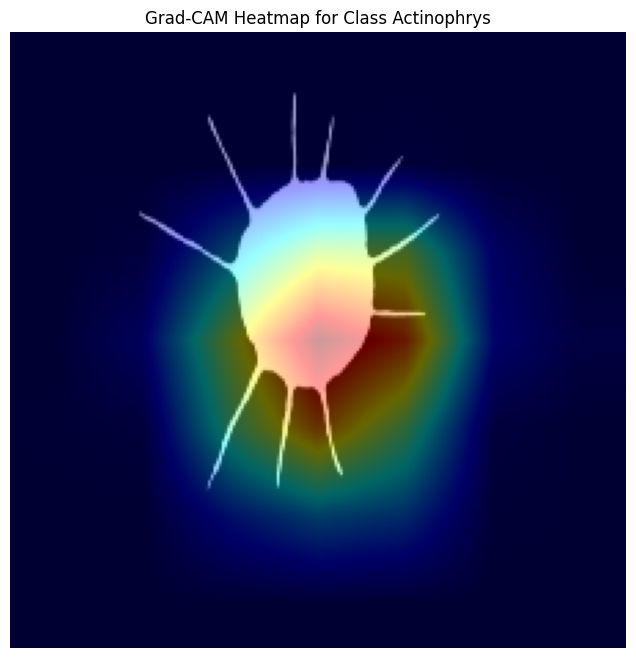

In [ ]:
# Load Model
model = load_model("resnet101_waterborne_disease_model.h5")

# Path to Test Image
img_path = "/content/drive/MyDrive/RESNETDATASET/Testing/Actinophrys/EMDS5-g01-08-GTM.png"

# Predict Class
img = load_img(img_path, target_size=(224, 224))
img_array = img_to_array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)

predictions = model.predict(img_array)
predicted_class = np.argmax(predictions[0])
confidence = predictions[0][predicted_class]

# Display Predicted Class
print(f"Predicted Class: {class_labels[predicted_class]} | Confidence: {confidence:.2f}")

# Apply Grad-CAM
grad_cam(model, img_path, predicted_class)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step
Predicted Class: Actinophrys
Confidence: 1.00


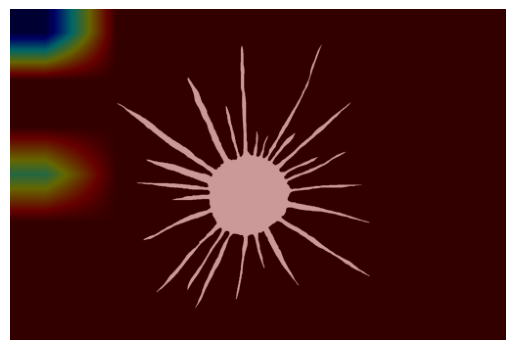

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Actinophrys/EMDS5-g01-04-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 659ms/step
Predicted Class: Actinophrys
Confidence: 1.00


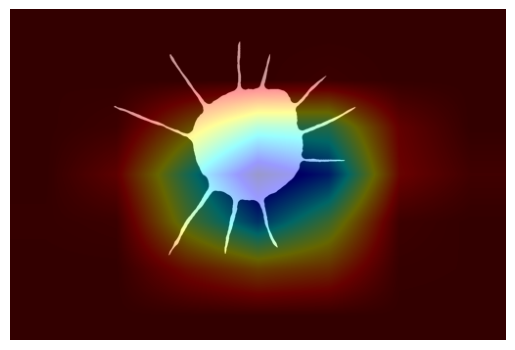

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Actinophrys/EMDS5-g01-08-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step
Predicted Class: Actinophrys
Confidence: 1.00


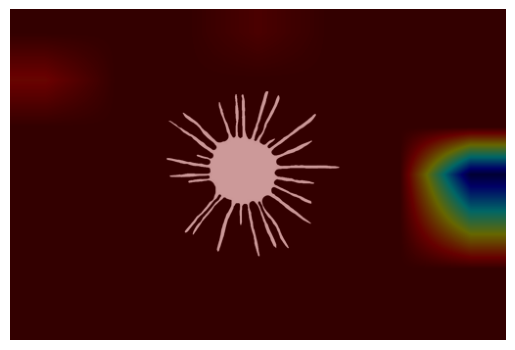

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Actinophrys/EMDS5-g01-13-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step
Predicted Class: Actinophrys
Confidence: 1.00


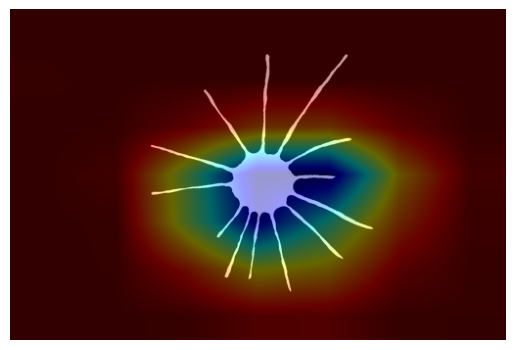

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Actinophrys/EMDS5-g01-18-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step
Predicted Class: Actinophrys
Confidence: 1.00


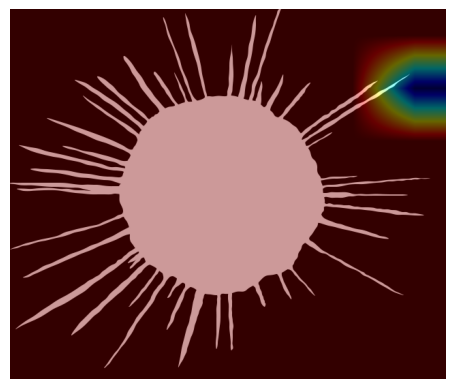

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Actinophrys/EMDS5-g01-27-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step
Predicted Class: Actinophrys
Confidence: 1.00


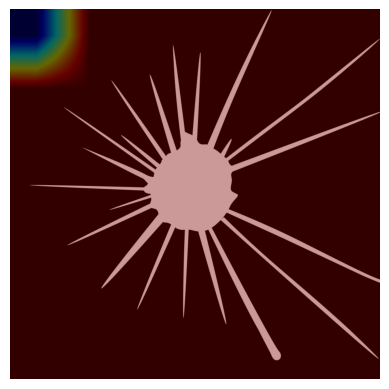

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Actinophrys/EMDS5-g01-31-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step
Predicted Class: Actinophrys
Confidence: 1.00


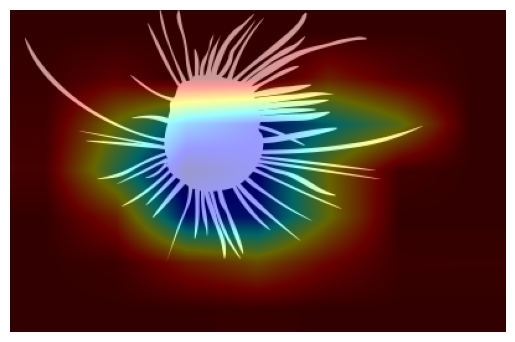

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Actinophrys/EMDS5-g01-37-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step
Predicted Class: Actinophrys
Confidence: 1.00


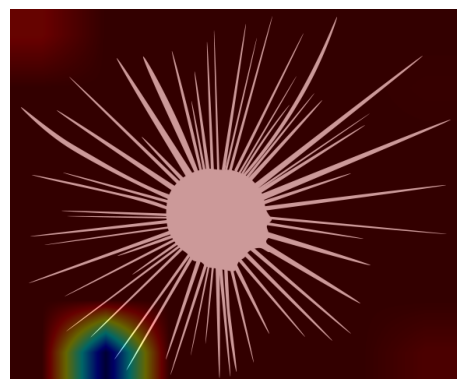

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Actinophrys/EMDS5-g01-40-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step
Predicted Class: Arcella
Confidence: 0.96


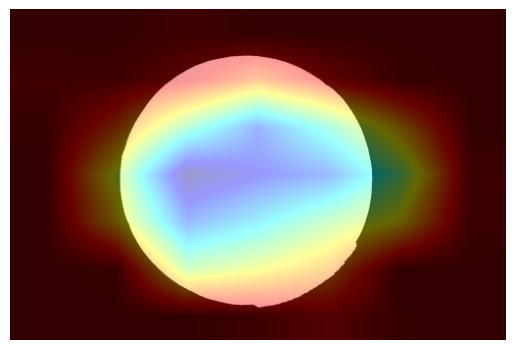

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Arcella/EMDS5-g02-09-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step
Predicted Class: Arcella
Confidence: 0.82


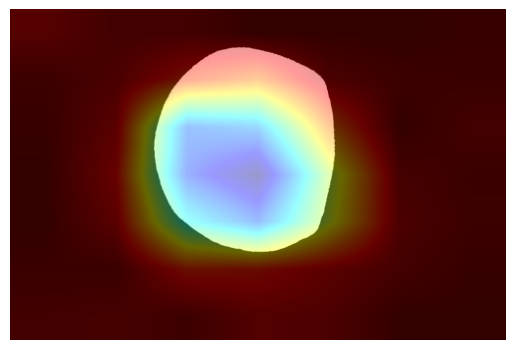

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Arcella/EMDS5-g02-18-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step
Predicted Class: Arcella
Confidence: 0.94


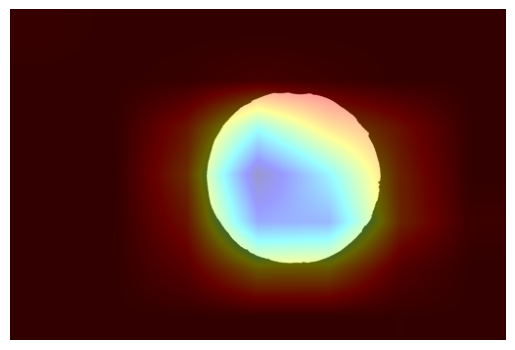

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Arcella/EMDS5-g02-20-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step
Predicted Class: Arcella
Confidence: 0.84


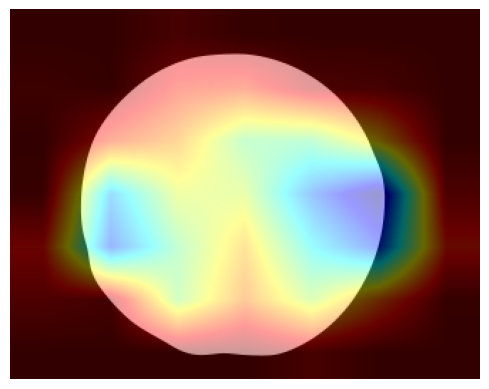

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Arcella/EMDS5-g02-26-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step
Predicted Class: Noctiluca
Confidence: 0.65


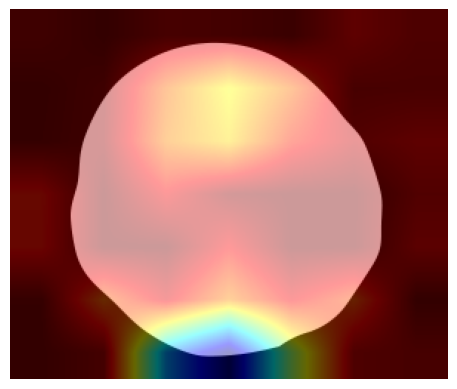

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Arcella/EMDS5-g02-34-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step
Predicted Class: Arcella
Confidence: 0.75


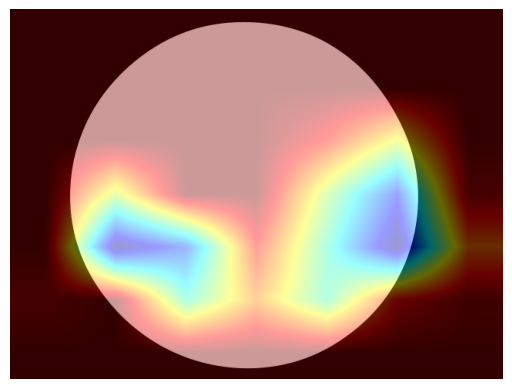

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Arcella/EMDS5-g02-35-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step
Predicted Class: Noctiluca
Confidence: 0.40


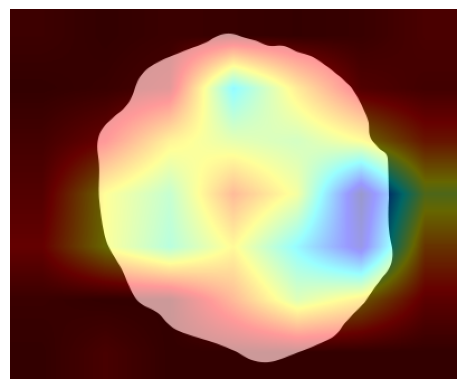

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Arcella/EMDS5-g02-36-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 643ms/step
Predicted Class: Arcella
Confidence: 0.65


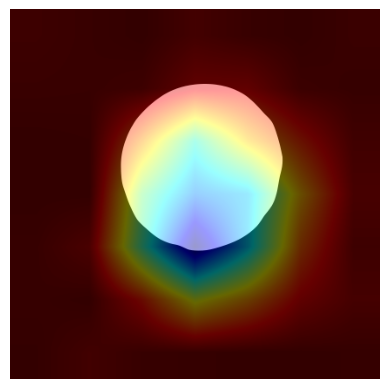

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Arcella/EMDS5-g02-40-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step
Predicted Class: Aspidisca
Confidence: 0.50


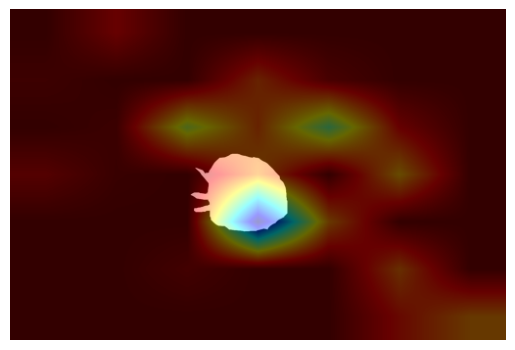

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Aspidisca/EMDS5-g03-02-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step
Predicted Class: Aspidisca
Confidence: 0.78


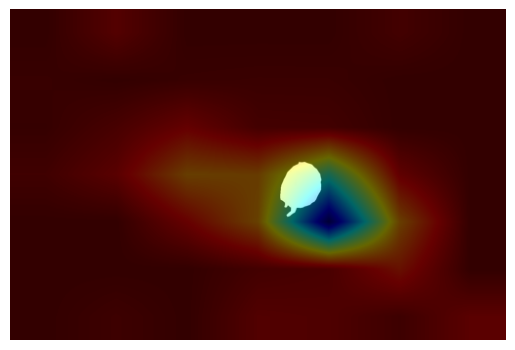

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Aspidisca/EMDS5-g03-07-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step
Predicted Class: Gymnodinium
Confidence: 0.41


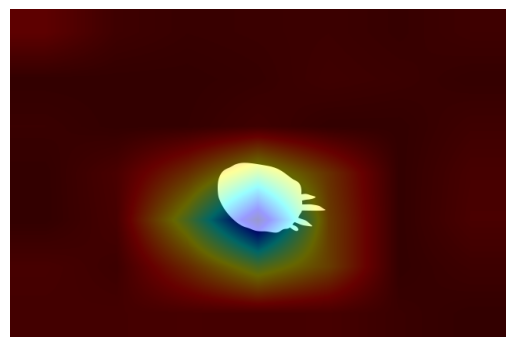

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Aspidisca/EMDS5-g03-21-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step
Predicted Class: Gymnodinium
Confidence: 0.42


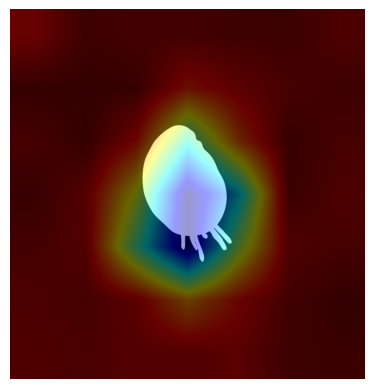

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Aspidisca/EMDS5-g03-24-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 650ms/step
Predicted Class: Gymnodinium
Confidence: 0.60


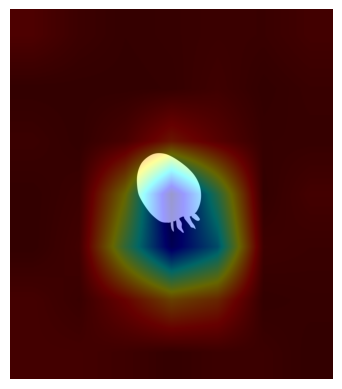

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Aspidisca/EMDS5-g03-25-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
Predicted Class: Aspidisca
Confidence: 0.99


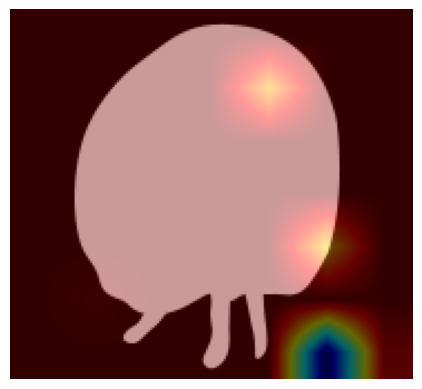

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Aspidisca/EMDS5-g03-26-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step
Predicted Class: Aspidisca
Confidence: 1.00


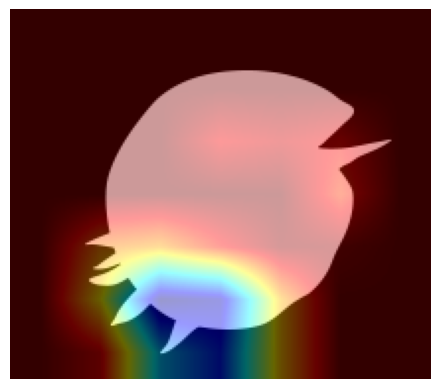

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Aspidisca/EMDS5-g03-38-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step
Predicted Class: Gymnodinium
Confidence: 0.53


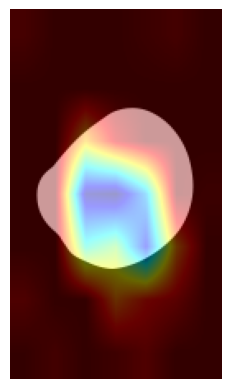

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Aspidisca/EMDS5-g03-40-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step
Predicted Class: Ceratium
Confidence: 1.00


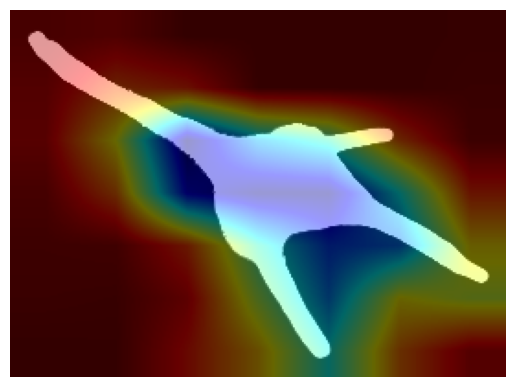

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Ceratium/EMDS5-g12-05-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step
Predicted Class: Ceratium
Confidence: 1.00


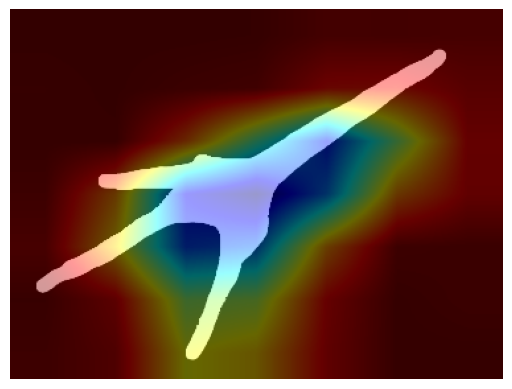

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Ceratium/EMDS5-g12-14-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step
Predicted Class: Ceratium
Confidence: 0.99


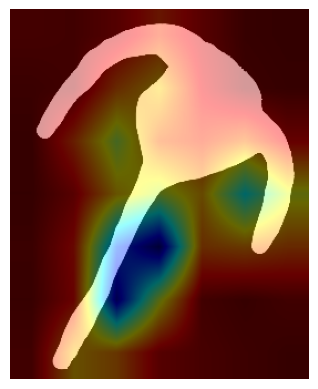

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Ceratium/EMDS5-g12-17-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step
Predicted Class: Ceratium
Confidence: 0.66


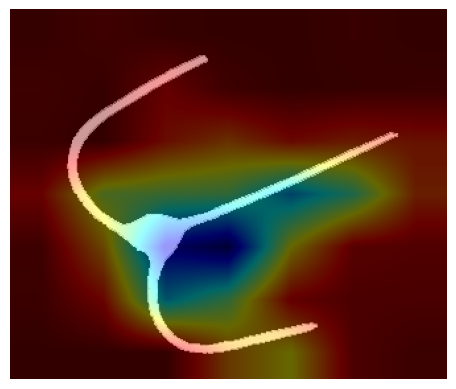

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Ceratium/EMDS5-g12-19-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step
Predicted Class: Stentor
Confidence: 0.29


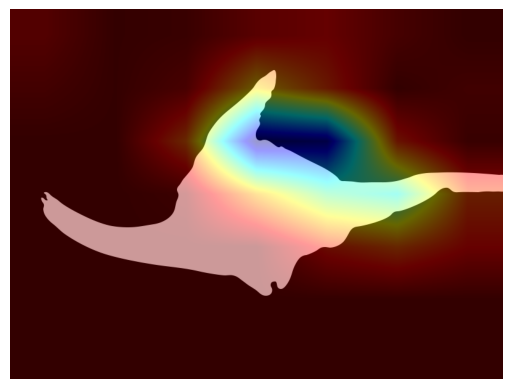

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Ceratium/EMDS5-g12-26-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 707ms/step
Predicted Class: Ceratium
Confidence: 1.00


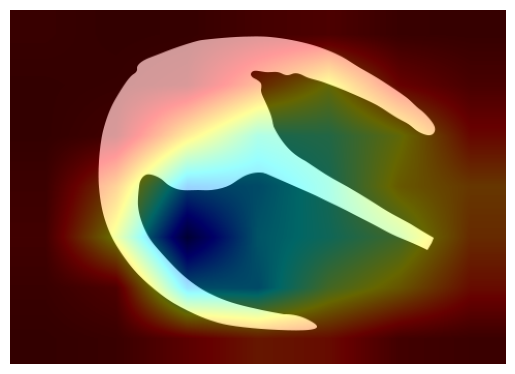

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Ceratium/EMDS5-g12-31-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step
Predicted Class: Ceratium
Confidence: 0.98


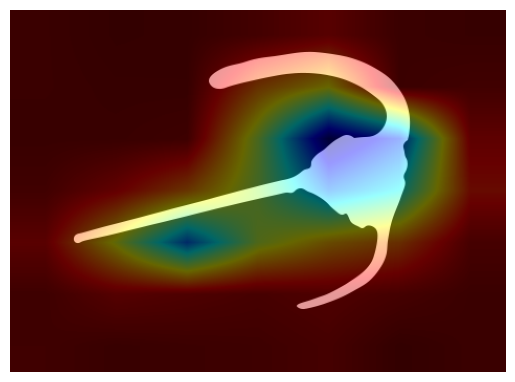

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Ceratium/EMDS5-g12-34-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step
Predicted Class: Ceratium
Confidence: 0.92


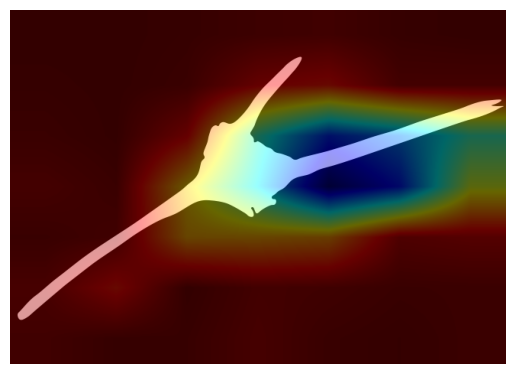

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Ceratium/EMDS5-g12-38-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step
Predicted Class: Vorticella
Confidence: 0.59


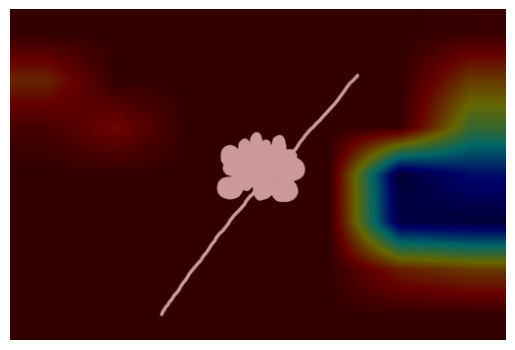

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Codosiga/EMDS5-g04-04-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step
Predicted Class: Codosiga
Confidence: 0.89


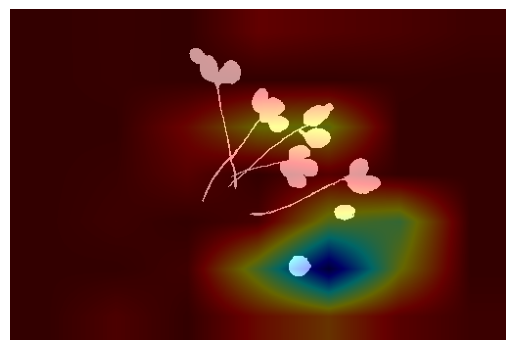

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Codosiga/EMDS5-g04-10-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step
Predicted Class: Codosiga
Confidence: 0.96


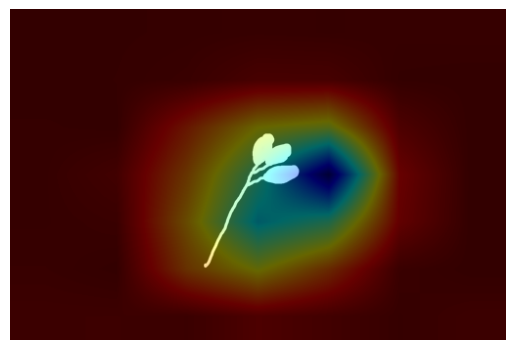

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Codosiga/EMDS5-g04-17-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step
Predicted Class: Codosiga
Confidence: 0.85


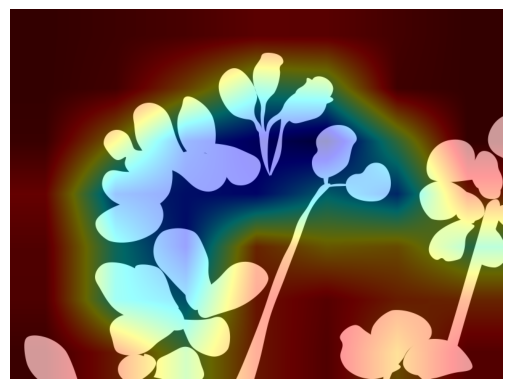

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Codosiga/EMDS5-g04-29-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step
Predicted Class: Codosiga
Confidence: 0.85


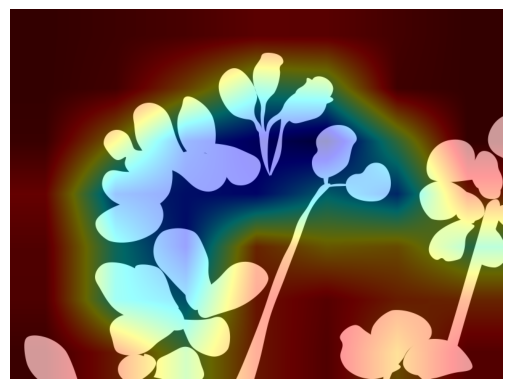

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Codosiga/EMDS5-g04-29-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step
Predicted Class: Codosiga
Confidence: 0.86


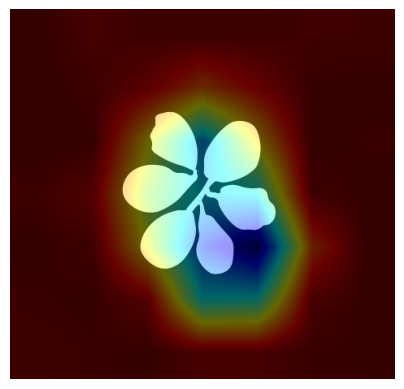

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Codosiga/EMDS5-g04-32-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step
Predicted Class: Epistylis
Confidence: 0.73


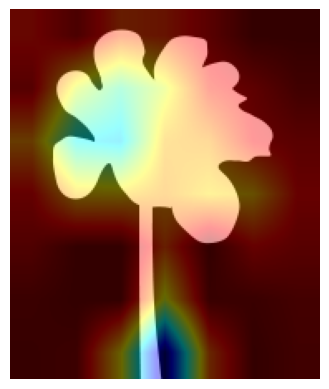

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Codosiga/EMDS5-g04-33-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step
Predicted Class: Codosiga
Confidence: 1.00


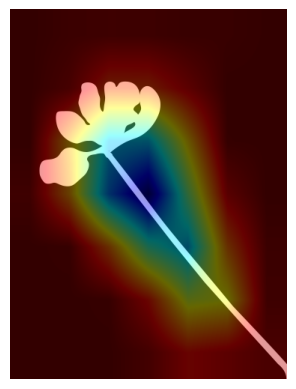

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Codosiga/EMDS5-g04-39-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 655ms/step
Predicted Class: Codosiga
Confidence: 1.00


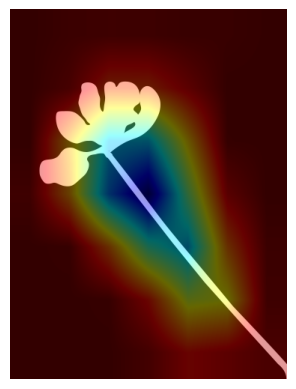

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Codosiga/EMDS5-g04-39-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step
Predicted Class: Epistylis
Confidence: 0.96


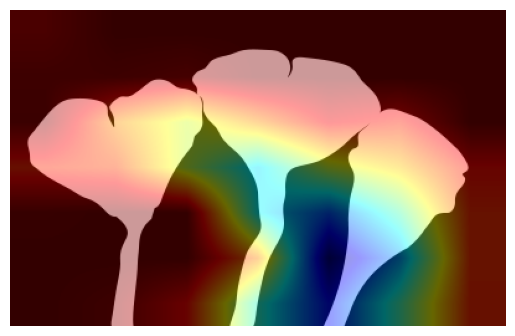

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Codosiga/EMDS5-g04-40-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step
Predicted Class: Gymnodinium
Confidence: 0.41


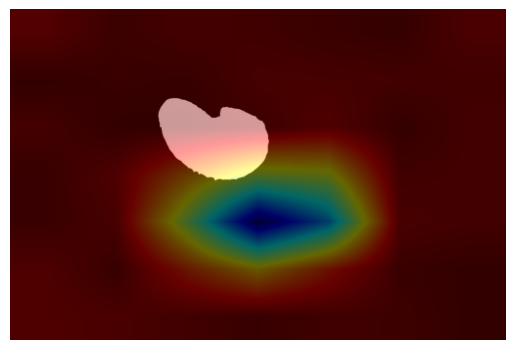

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Colpoda/EMDS5-g05-02-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step
Predicted Class: Aspidisca
Confidence: 0.47


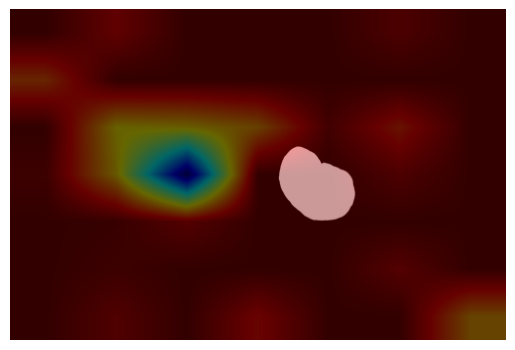

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Colpoda/EMDS5-g05-11-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step
Predicted Class: Colpoda
Confidence: 0.43


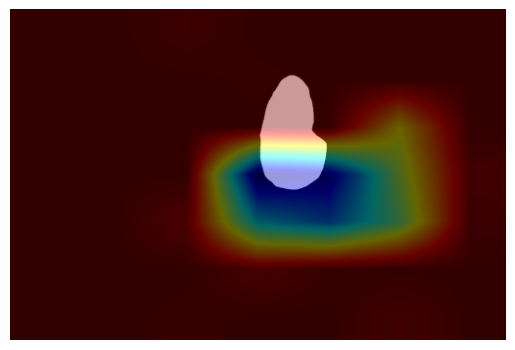

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Colpoda/EMDS5-g05-16-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step
Predicted Class: Colpoda
Confidence: 0.71


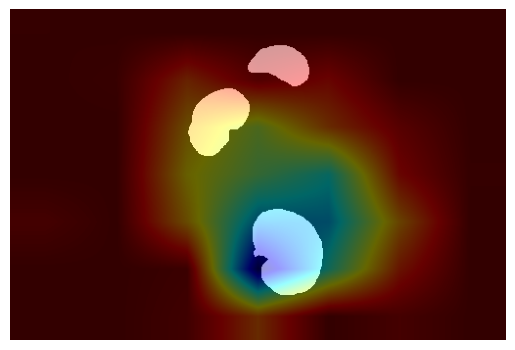

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Colpoda/EMDS5-g05-17-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step
Predicted Class: Paramecium
Confidence: 0.33


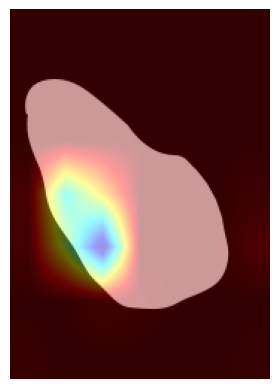

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Colpoda/EMDS5-g05-21-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step
Predicted Class: Gymnodinium
Confidence: 0.72


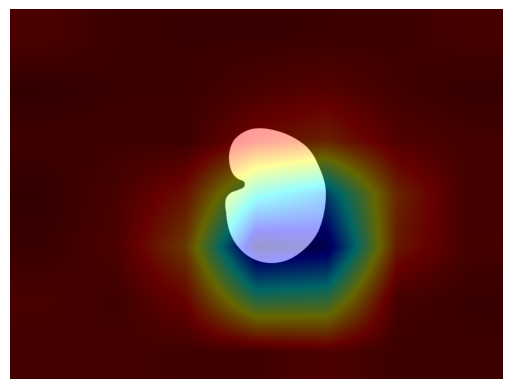

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Colpoda/EMDS5-g05-28-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 626ms/step
Predicted Class: Gymnodinium
Confidence: 0.72


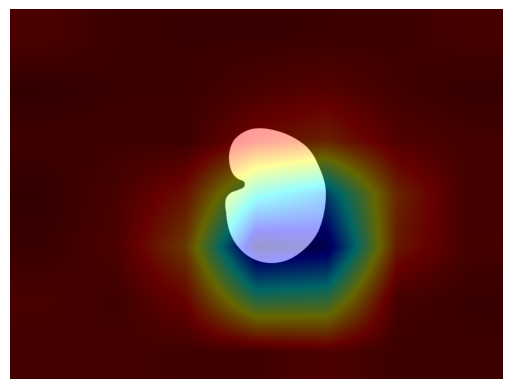

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Colpoda/EMDS5-g05-28-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step
Predicted Class: Arcella
Confidence: 0.72


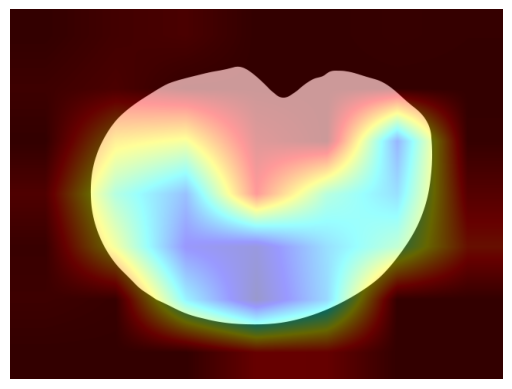

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Colpoda/EMDS5-g05-31-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step
Predicted Class: Noctiluca
Confidence: 0.40


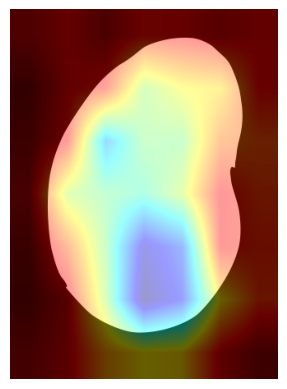

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Colpoda/EMDS5-g05-37-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 657ms/step
Predicted Class: Epistylis
Confidence: 1.00


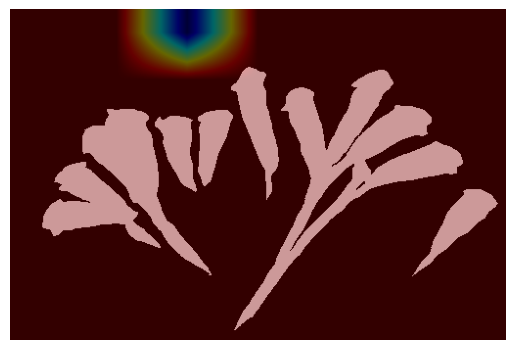

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Epistylis/EMDS5-g06-03-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
Predicted Class: Epistylis
Confidence: 0.92


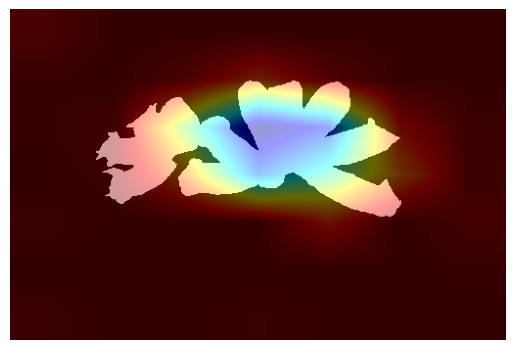

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Epistylis/EMDS5-g06-10-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step
Predicted Class: Epistylis
Confidence: 1.00


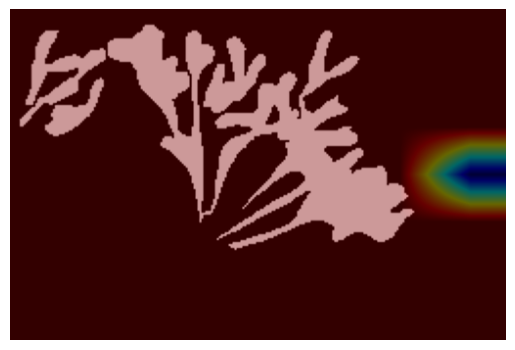

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Epistylis/EMDS5-g06-17-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step
Predicted Class: Epistylis
Confidence: 0.42


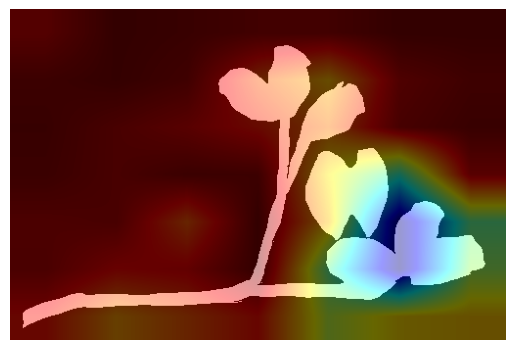

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Epistylis/EMDS5-g06-18-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step
Predicted Class: Vorticella
Confidence: 0.67


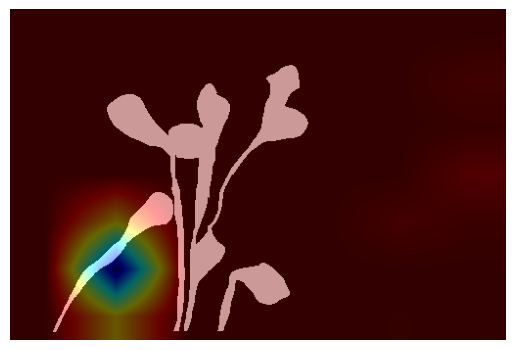

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Epistylis/EMDS5-g06-19-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 662ms/step
Predicted Class: Epistylis
Confidence: 1.00


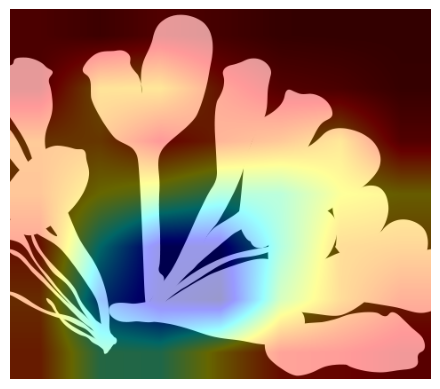

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Epistylis/EMDS5-g06-29-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step
Predicted Class: Epistylis
Confidence: 1.00


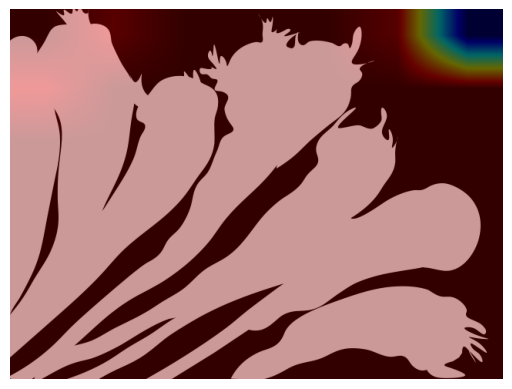

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Epistylis/EMDS5-g06-33-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step
Predicted Class: Epistylis
Confidence: 1.00


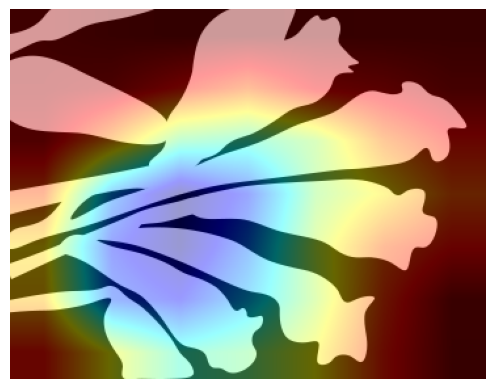

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Epistylis/EMDS5-g06-40-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 659ms/step
Predicted Class: Euglena
Confidence: 0.84


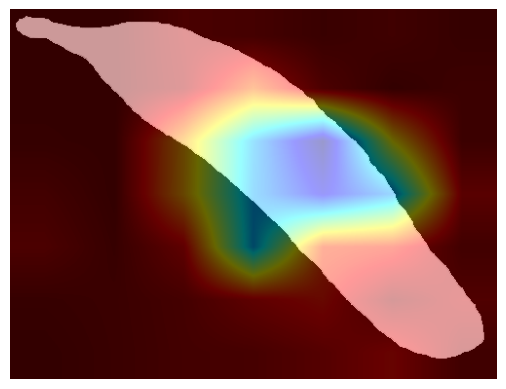

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Euglena/EMDS5-g16-01-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step
Predicted Class: Euglena
Confidence: 0.74


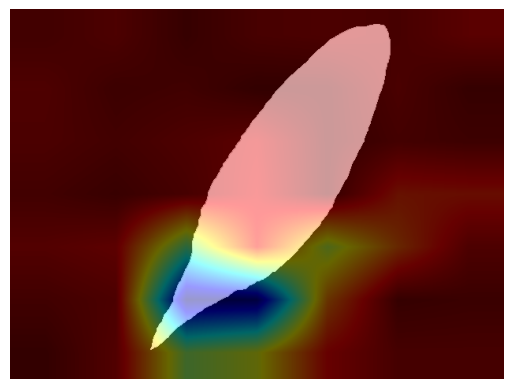

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Euglena/EMDS5-g16-12-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step
Predicted Class: Paramecium
Confidence: 0.65


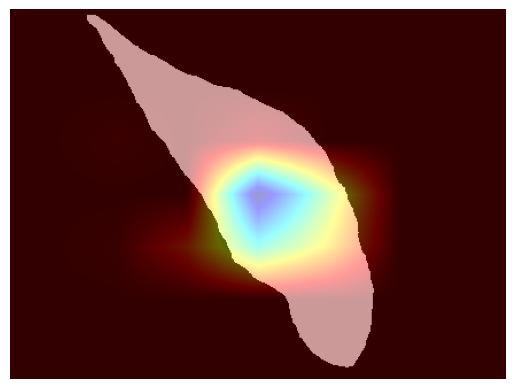

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Euglena/EMDS5-g16-13-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step
Predicted Class: Paramecium
Confidence: 0.25


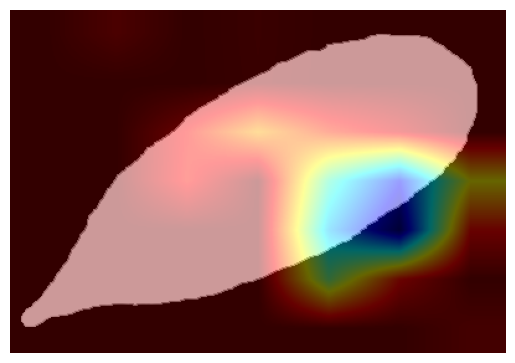

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Euglena/EMDS5-g16-16-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step
Predicted Class: Euglena
Confidence: 0.66


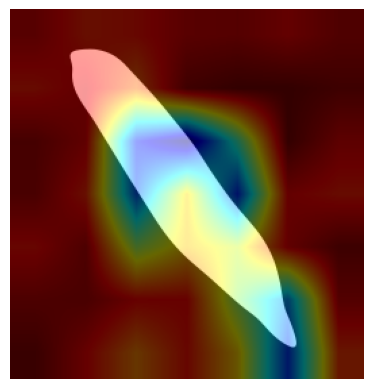

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Euglena/EMDS5-g16-21-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step
Predicted Class: Siprostomum
Confidence: 0.99


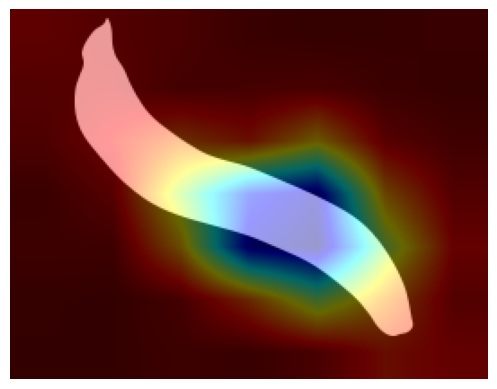

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Euglena/EMDS5-g16-22-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step
Predicted Class: Vorticella
Confidence: 0.40


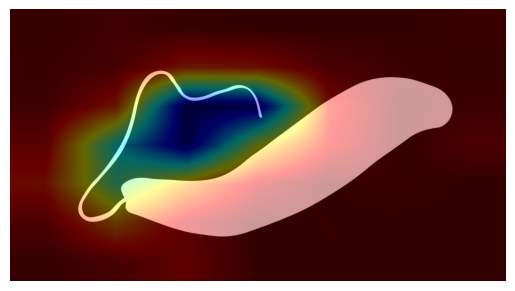

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Euglena/EMDS5-g16-25-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step
Predicted Class: Euglena
Confidence: 0.91


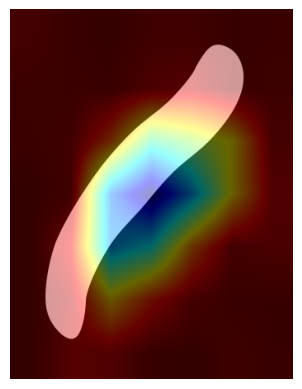

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Euglena/EMDS5-g16-38-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 663ms/step
Predicted Class: Euglypha
Confidence: 0.99


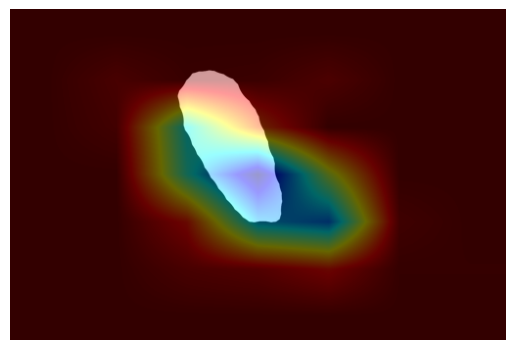

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Euglypha/EMDS5-g07-09-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
Predicted Class: Gymnodinium
Confidence: 0.77


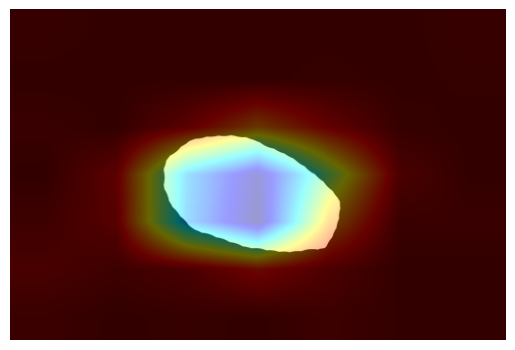

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Euglypha/EMDS5-g07-12-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step
Predicted Class: Paramecium
Confidence: 0.91


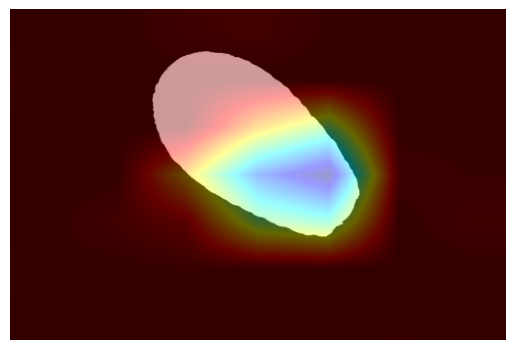

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Euglypha/EMDS5-g07-14-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 669ms/step
Predicted Class: Phacus
Confidence: 0.44


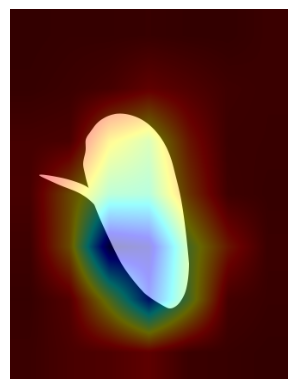

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Euglypha/EMDS5-g07-22-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step
Predicted Class: Euglypha
Confidence: 0.47


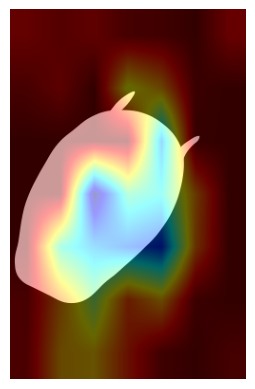

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Euglypha/EMDS5-g07-24-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step
Predicted Class: Arcella
Confidence: 0.50


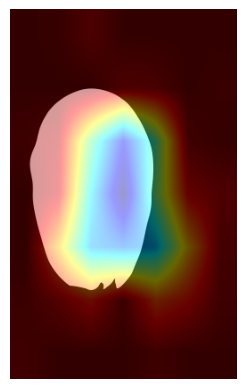

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Euglypha/EMDS5-g07-27-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step
Predicted Class: Stylongchia
Confidence: 0.67


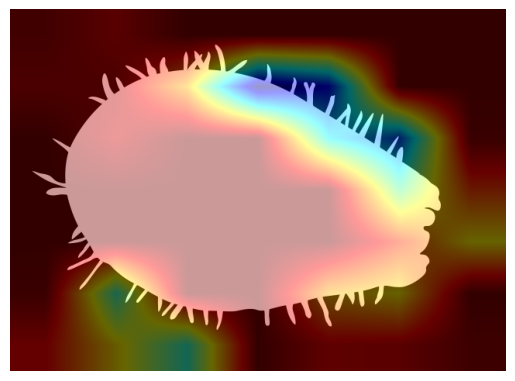

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Euglypha/EMDS5-g07-32-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step
Predicted Class: Noctiluca
Confidence: 0.65


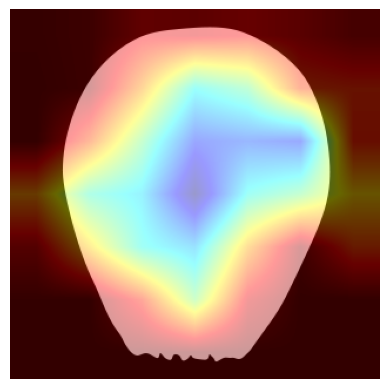

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Euglypha/EMDS5-g07-36-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step
Predicted Class: Gonyaulax
Confidence: 1.00


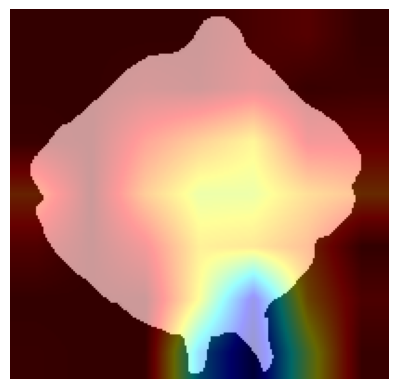

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Gonyaulax/EMDS5-g18-08-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step
Predicted Class: Gymnodinium
Confidence: 0.59


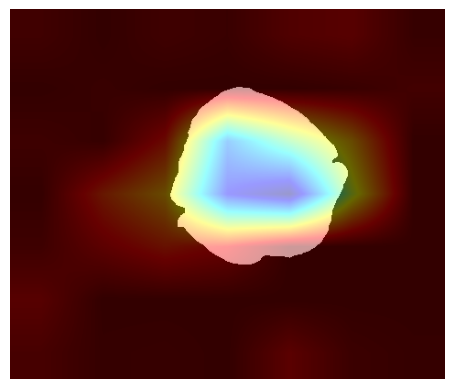

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Gonyaulax/EMDS5-g18-13-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step
Predicted Class: Gymnodinium
Confidence: 0.51


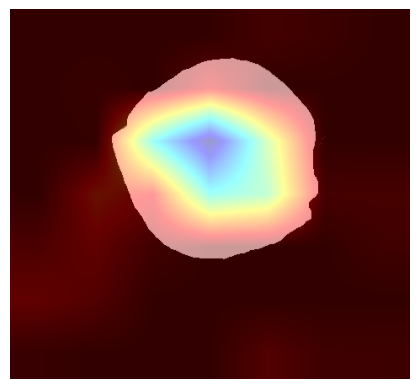

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Gonyaulax/EMDS5-g18-14-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step
Predicted Class: Noctiluca
Confidence: 0.43


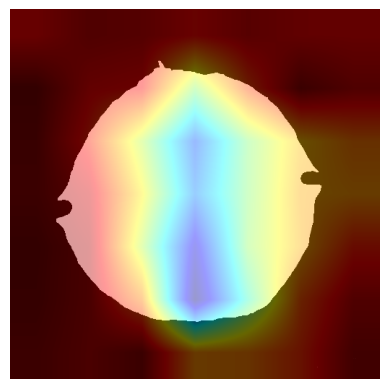

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Gonyaulax/EMDS5-g18-16-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step
Predicted Class: Gonyaulax
Confidence: 0.93


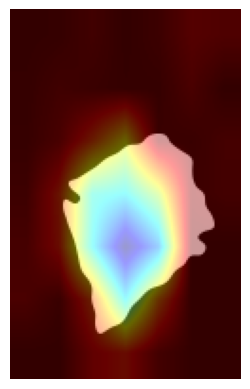

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Gonyaulax/EMDS5-g18-27-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step
Predicted Class: Gonyaulax
Confidence: 0.99


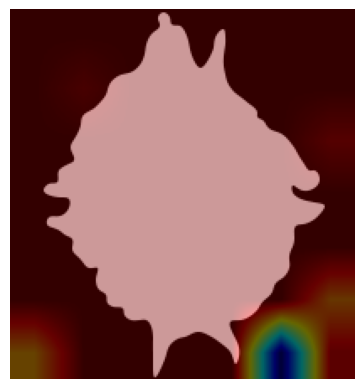

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Gonyaulax/EMDS5-g18-32-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step
Predicted Class: Gonyaulax
Confidence: 0.96


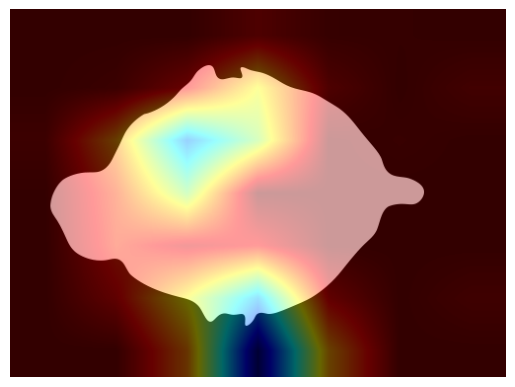

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Gonyaulax/EMDS5-g18-34-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step
Predicted Class: Gonyaulax
Confidence: 0.93


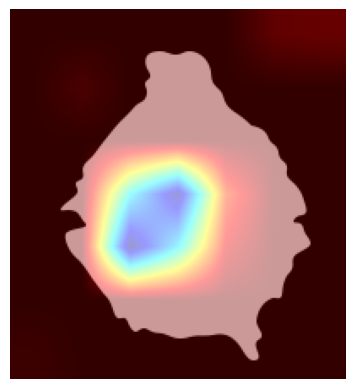

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Gonyaulax/EMDS5-g18-36-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 619ms/step
Predicted Class: Gymnodinium
Confidence: 0.91


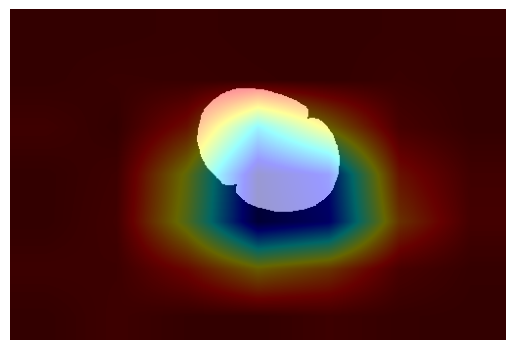

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Gymnodinium/EMDS5-g17-04-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step
Predicted Class: Gymnodinium
Confidence: 0.87


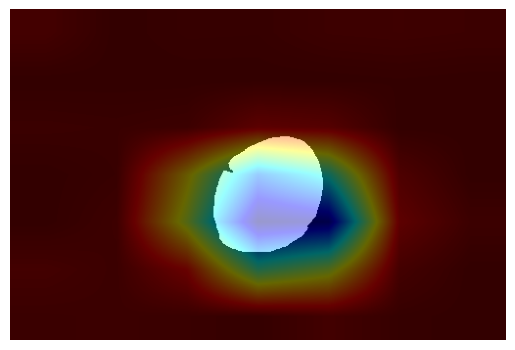

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Gymnodinium/EMDS5-g17-11-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 688ms/step
Predicted Class: Gymnodinium
Confidence: 0.60


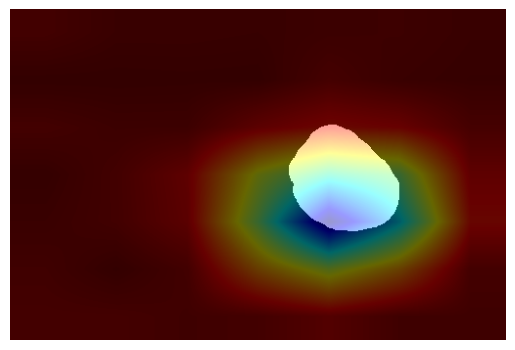

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Gymnodinium/EMDS5-g17-12-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step
Predicted Class: Arcella
Confidence: 0.45


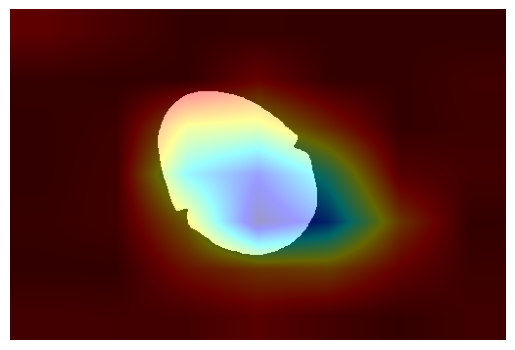

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Gymnodinium/EMDS5-g17-15-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step
Predicted Class: Arcella
Confidence: 0.66


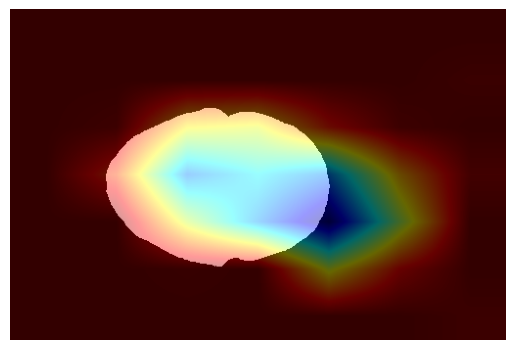

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Gymnodinium/EMDS5-g17-19-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 657ms/step
Predicted Class: Gymnodinium
Confidence: 0.70


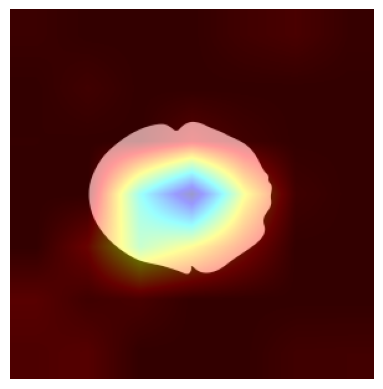

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Gymnodinium/EMDS5-g17-26-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step
Predicted Class: Gymnodinium
Confidence: 0.85


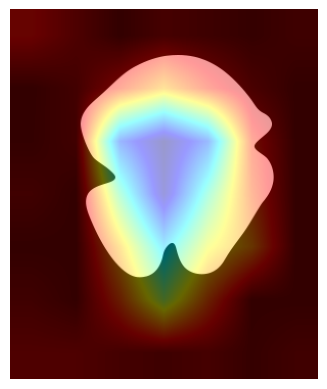

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Gymnodinium/EMDS5-g17-32-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step
Predicted Class: Gonyaulax
Confidence: 0.79


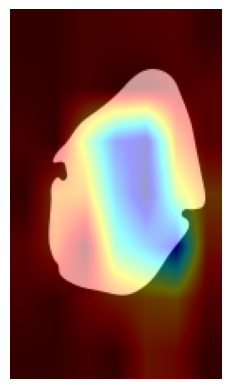

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Gradient of the output neuron (class) with respect to feature map
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature map
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Test the Grad-CAM on a single image
img_path = '/content/drive/MyDrive/RESNETDATASET/Testing/Gymnodinium/EMDS5-g17-35-GTM.png'
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# Predict and display Grad-CAM
predictions = model.predict(img_array)
predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]  # Fixed this line

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {np.max(predictions):.2f}")

# Generate Grad-CAM heatmap
heatmap = generate_gradcam(model, img_array, layer_name="conv5_block3_out")  # Adjust to ResNet layer
overlay_gradcam(img_path, heatmap)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 701ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Keretella Quadrala/EMDS5-g15-02-GTM.png
Predicted Class: Karetella Quadrala
Confidence: 1.00


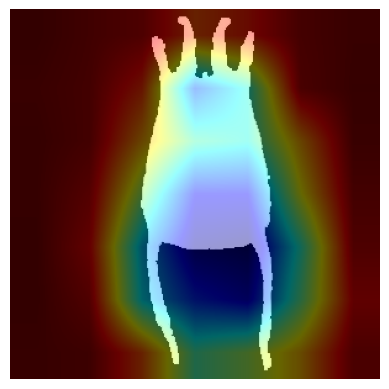

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Keretella Quadrala/EMDS5-g15-07-GTM.png
Predicted Class: Karetella Quadrala
Confidence: 1.00


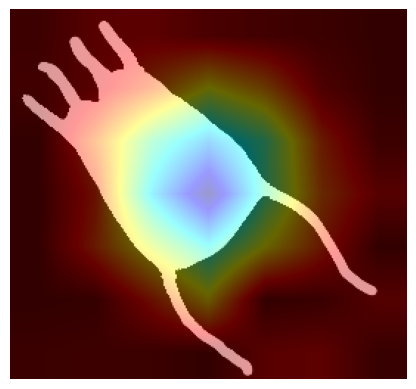

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Keretella Quadrala/EMDS5-g15-10-GTM.png
Predicted Class: Karetella Quadrala
Confidence: 0.94


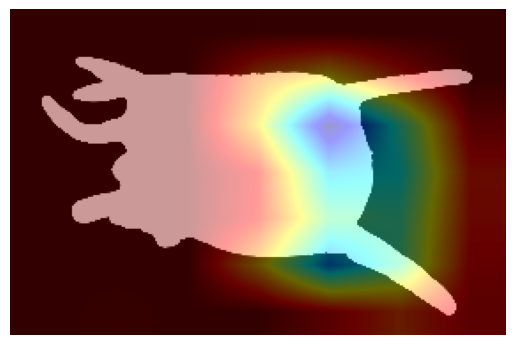

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Keretella Quadrala/EMDS5-g15-20-GTM.png
Predicted Class: Karetella Quadrala
Confidence: 1.00


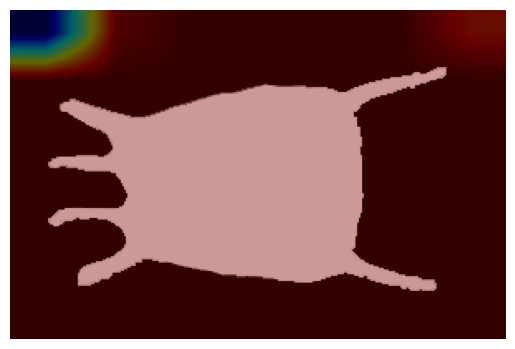

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Keretella Quadrala/EMDS5-g15-29-GTM.png
Predicted Class: Karetella Quadrala
Confidence: 0.93


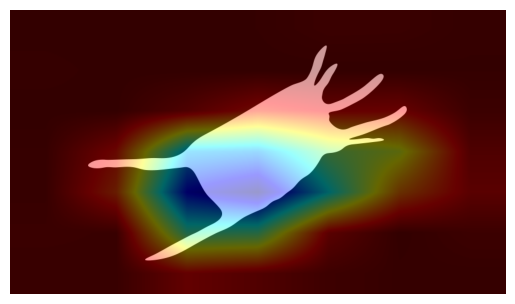

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Keretella Quadrala/EMDS5-g15-30-GTM.png
Predicted Class: Karetella Quadrala
Confidence: 1.00


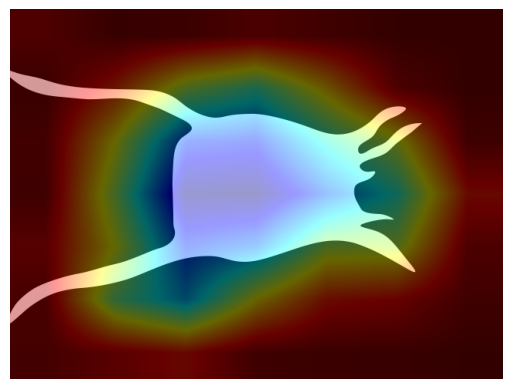

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Keretella Quadrala/EMDS5-g15-38-GTM.png
Predicted Class: Karetella Quadrala
Confidence: 1.00


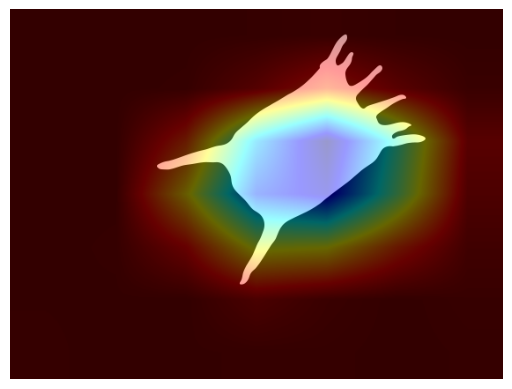

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Keretella Quadrala/EMDS5-g15-39-GTM.png
Predicted Class: Karetella Quadrala
Confidence: 1.00


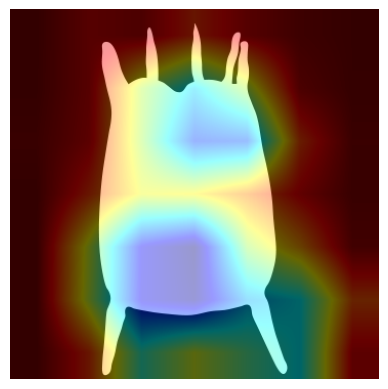

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import tensorflow as tf

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Compute gradients
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature maps
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)  # Normalize heatmap

    return heatmap

# Function to overlay Grad-CAM heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Function to test multiple images
def test_multiple_images(image_folder, model, layer_name, target_size=(224, 224)):
    image_paths = [os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith(('.jpg', '.png', '.jpeg'))]

    for img_path in image_paths:
        # Preprocess image
        img = tf.keras.utils.load_img(img_path, target_size=target_size)
        img_array = tf.keras.utils.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize to [0, 1]

        # Predict class
        predictions = model.predict(img_array)
        predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]
        confidence = np.max(predictions)

        print(f"Image: {img_path}")
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence:.2f}")

        # Generate and overlay Grad-CAM heatmap
        heatmap = generate_gradcam(model, img_array, layer_name)
        overlay_gradcam(img_path, heatmap)

# Path to test images folder
test_image_folder = "/content/drive/MyDrive/RESNETDATASET/Testing/Keretella Quadrala"  # Replace with the folder path

# Call the multi-image testing function
test_multiple_images(test_image_folder, model, layer_name="conv5_block3_out")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 632ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Noctiluca/EMDS5-g11-03-GTM.png
Predicted Class: Noctiluca
Confidence: 0.53


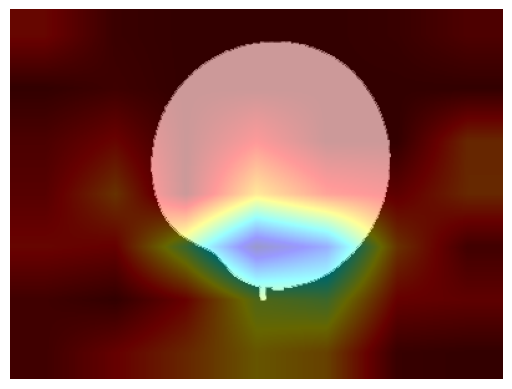

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Noctiluca/EMDS5-g11-04-GTM.png
Predicted Class: Arcella
Confidence: 0.52


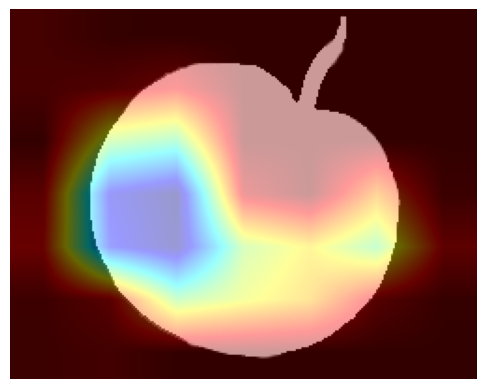

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Noctiluca/EMDS5-g11-16-GTM.png
Predicted Class: Noctiluca
Confidence: 0.96


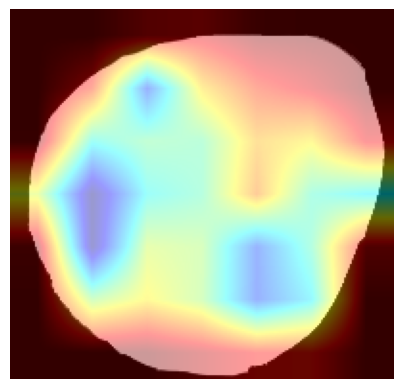

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Noctiluca/EMDS5-g11-23-GTM.png
Predicted Class: Noctiluca
Confidence: 0.95


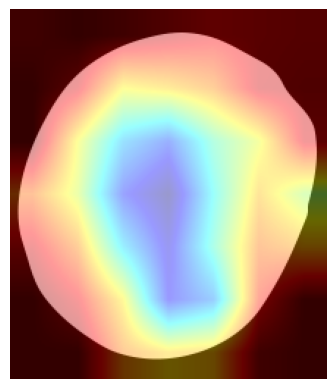

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Noctiluca/EMDS5-g11-26-GTM.png
Predicted Class: Noctiluca
Confidence: 0.56


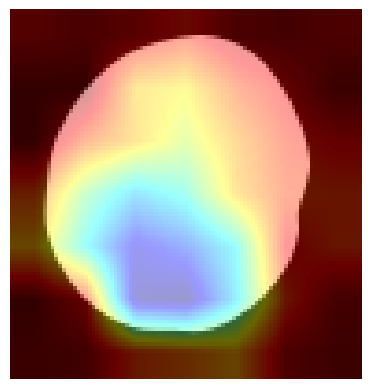

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Noctiluca/EMDS5-g11-30-GTM.png
Predicted Class: Noctiluca
Confidence: 0.91


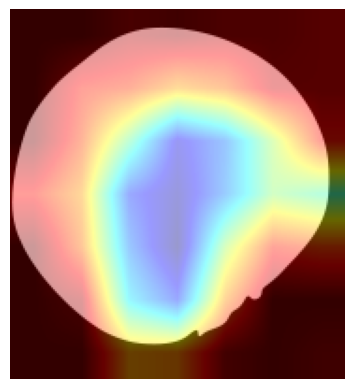

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Noctiluca/EMDS5-g11-33-GTM.png
Predicted Class: Noctiluca
Confidence: 0.95


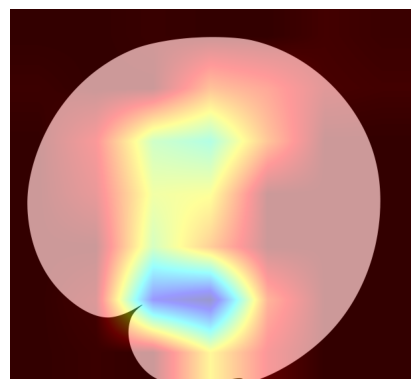

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Noctiluca/EMDS5-g11-38-GTM.png
Predicted Class: Arcella
Confidence: 0.94


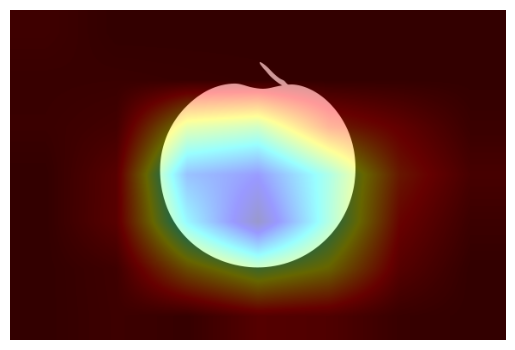

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import tensorflow as tf

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Compute gradients
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature maps
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)  # Normalize heatmap

    return heatmap

# Function to overlay Grad-CAM heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Function to test multiple images
def test_multiple_images(image_folder, model, layer_name, target_size=(224, 224)):
    image_paths = [os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith(('.jpg', '.png', '.jpeg'))]

    for img_path in image_paths:
        # Preprocess image
        img = tf.keras.utils.load_img(img_path, target_size=target_size)
        img_array = tf.keras.utils.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize to [0, 1]

        # Predict class
        predictions = model.predict(img_array)
        predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]
        confidence = np.max(predictions)

        print(f"Image: {img_path}")
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence:.2f}")

        # Generate and overlay Grad-CAM heatmap
        heatmap = generate_gradcam(model, img_array, layer_name)
        overlay_gradcam(img_path, heatmap)

# Path to test images folder
test_image_folder = "/content/drive/MyDrive/RESNETDATASET/Testing/Noctiluca"  # Replace with the folder path

# Call the multi-image testing function
test_multiple_images(test_image_folder, model, layer_name="conv5_block3_out")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Paramecium/EMDS5-g08-09-GTM.png
Predicted Class: Euglena
Confidence: 0.70


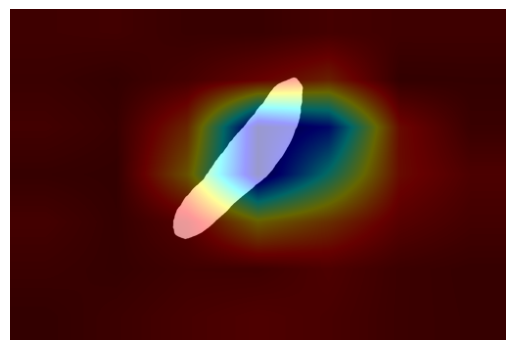

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Paramecium/EMDS5-g08-18-GTM.png
Predicted Class: Euglena
Confidence: 0.49


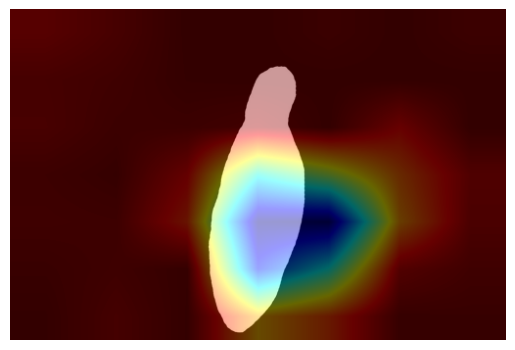

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Paramecium/EMDS5-g08-05-GTM.png
Predicted Class: Euglena
Confidence: 0.52


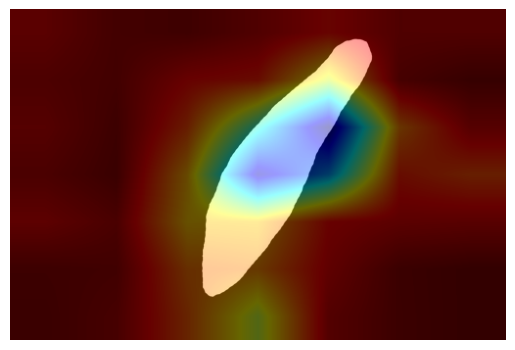

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 639ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Paramecium/EMDS5-g08-04-GTM.png
Predicted Class: Paramecium
Confidence: 1.00


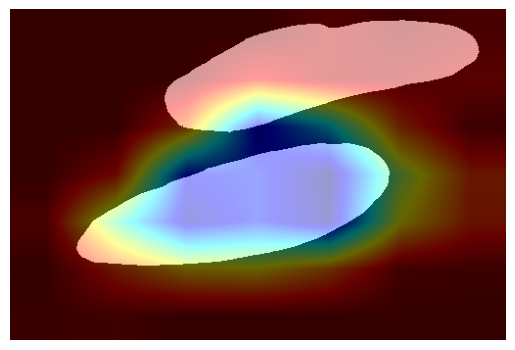

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Paramecium/EMDS5-g08-24-GTM.png
Predicted Class: Paramecium
Confidence: 0.82


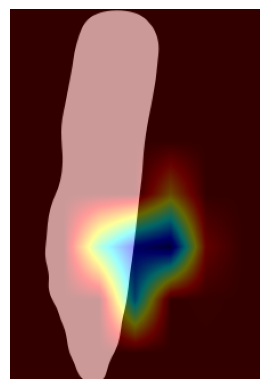

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Paramecium/EMDS5-g08-25-GTM.png
Predicted Class: Paramecium
Confidence: 0.99


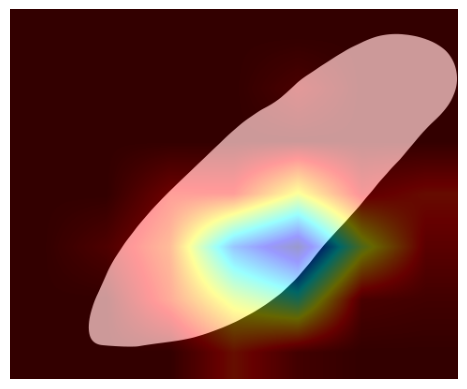

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Paramecium/EMDS5-g08-29-GTM.png
Predicted Class: Paramecium
Confidence: 0.99


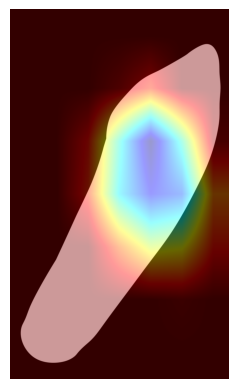

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Paramecium/EMDS5-g08-30-GTM.png
Predicted Class: Paramecium
Confidence: 0.98


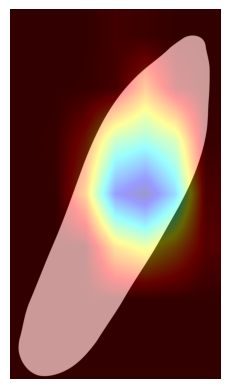

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import tensorflow as tf

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Compute gradients
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature maps
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)  # Normalize heatmap

    return heatmap

# Function to overlay Grad-CAM heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Function to test multiple images
def test_multiple_images(image_folder, model, layer_name, target_size=(224, 224)):
    image_paths = [os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith(('.jpg', '.png', '.jpeg'))]

    for img_path in image_paths:
        # Preprocess image
        img = tf.keras.utils.load_img(img_path, target_size=target_size)
        img_array = tf.keras.utils.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize to [0, 1]

        # Predict class
        predictions = model.predict(img_array)
        predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]
        confidence = np.max(predictions)

        print(f"Image: {img_path}")
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence:.2f}")

        # Generate and overlay Grad-CAM heatmap
        heatmap = generate_gradcam(model, img_array, layer_name)
        overlay_gradcam(img_path, heatmap)

# Path to test images folder
test_image_folder = "/content/drive/MyDrive/RESNETDATASET/Testing/Paramecium"  # Replace with the folder path

# Call the multi-image testing function
test_multiple_images(test_image_folder, model, layer_name="conv5_block3_out")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Phacus/EMDS5-g19-03-GTM.png
Predicted Class: Phacus
Confidence: 1.00


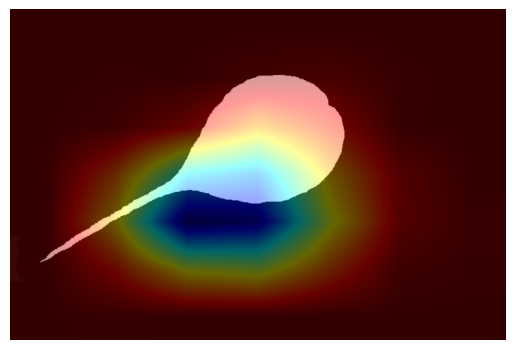

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Phacus/EMDS5-g19-07-GTM.png
Predicted Class: Phacus
Confidence: 0.70


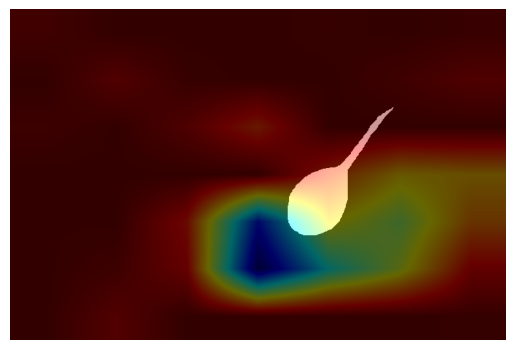

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Phacus/EMDS5-g19-13-GTM.png
Predicted Class: Noctiluca
Confidence: 0.31


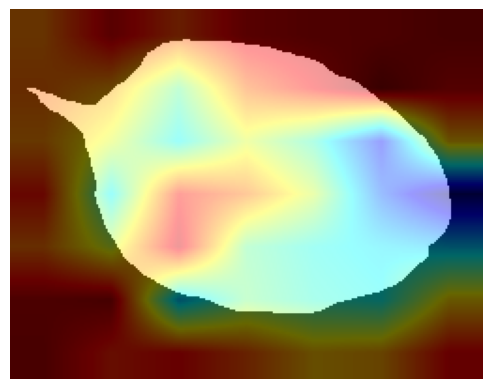

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Phacus/EMDS5-g19-17-GTM.png
Predicted Class: Gymnodinium
Confidence: 0.64


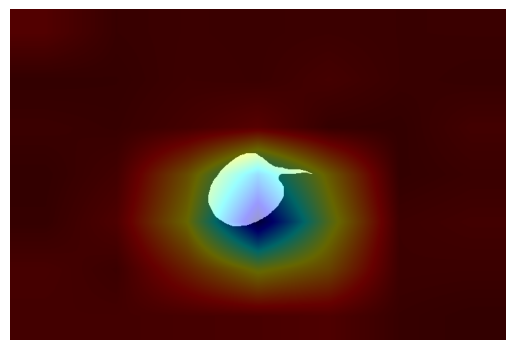

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Phacus/EMDS5-g19-22-GTM.png
Predicted Class: Phacus
Confidence: 0.89


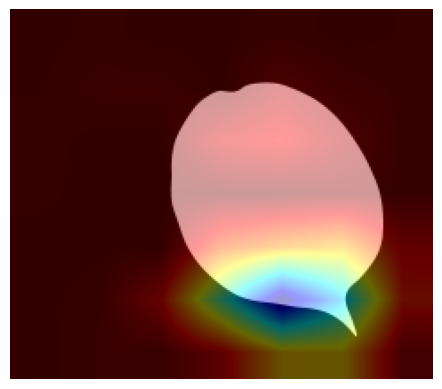

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Phacus/EMDS5-g19-27-GTM.png
Predicted Class: Paramecium
Confidence: 0.98


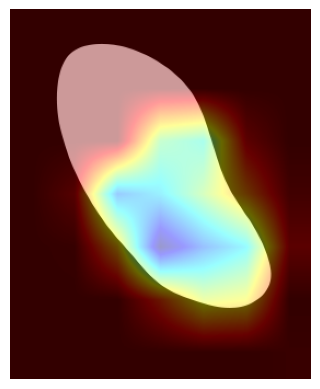

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Phacus/EMDS5-g19-30-GTM.png
Predicted Class: Phacus
Confidence: 0.98


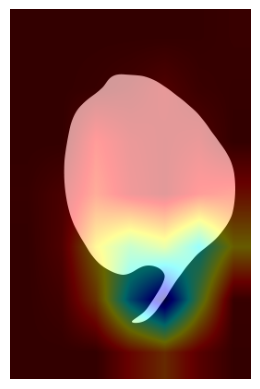

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Phacus/EMDS5-g19-40-GTM.png
Predicted Class: Phacus
Confidence: 1.00


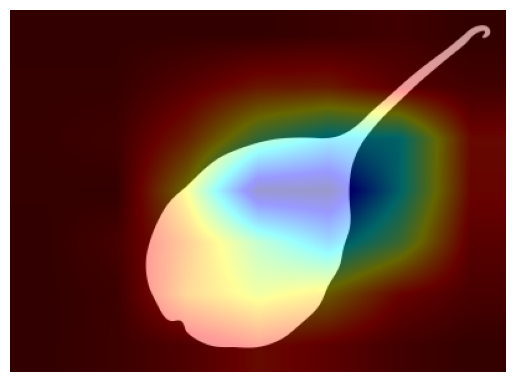

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import tensorflow as tf

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Compute gradients
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature maps
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)  # Normalize heatmap

    return heatmap

# Function to overlay Grad-CAM heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Function to test multiple images
def test_multiple_images(image_folder, model, layer_name, target_size=(224, 224)):
    image_paths = [os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith(('.jpg', '.png', '.jpeg'))]

    for img_path in image_paths:
        # Preprocess image
        img = tf.keras.utils.load_img(img_path, target_size=target_size)
        img_array = tf.keras.utils.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize to [0, 1]

        # Predict class
        predictions = model.predict(img_array)
        predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]
        confidence = np.max(predictions)

        print(f"Image: {img_path}")
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence:.2f}")

        # Generate and overlay Grad-CAM heatmap
        heatmap = generate_gradcam(model, img_array, layer_name)
        overlay_gradcam(img_path, heatmap)

# Path to test images folder
test_image_folder = "/content/drive/MyDrive/RESNETDATASET/Testing/Phacus"  # Replace with the folder path

# Call the multi-image testing function
test_multiple_images(test_image_folder, model, layer_name="conv5_block3_out")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Rotifera/EMDS5-g09-04-GTM.png
Predicted Class: Phacus
Confidence: 0.97


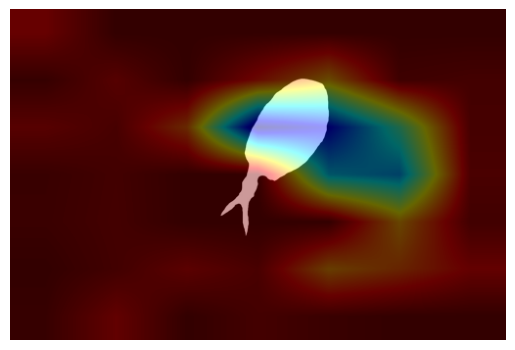

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 648ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Rotifera/EMDS5-g09-07-GTM.png
Predicted Class: Rotifera
Confidence: 0.53


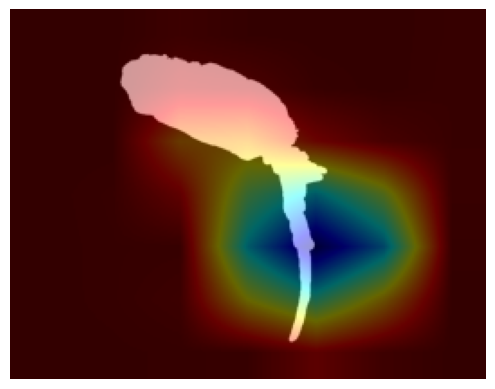

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Rotifera/EMDS5-g09-08-GTM.png
Predicted Class: Ceratium
Confidence: 0.33


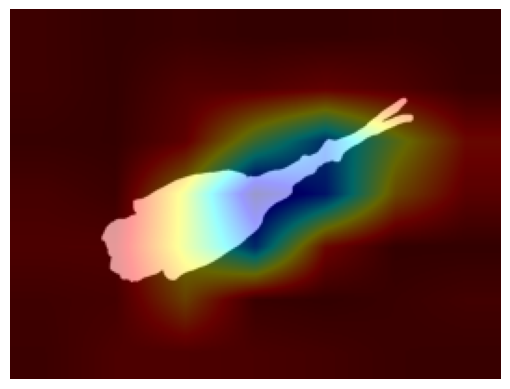

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Rotifera/EMDS5-g09-10-GTM.png
Predicted Class: Phacus
Confidence: 0.90


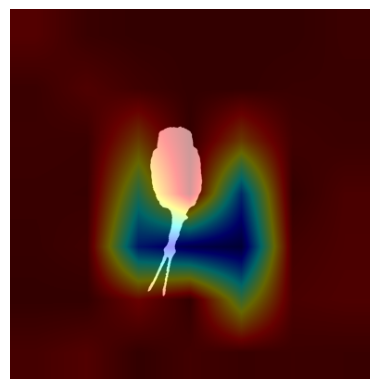

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Rotifera/EMDS5-g09-16-GTM.png
Predicted Class: Rotifera
Confidence: 0.71


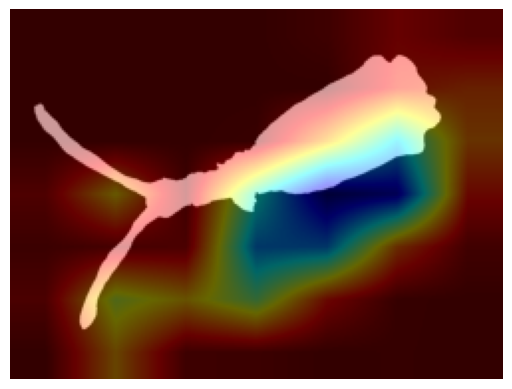

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Rotifera/EMDS5-g09-23-GTM.png
Predicted Class: Karetella Quadrala
Confidence: 0.89


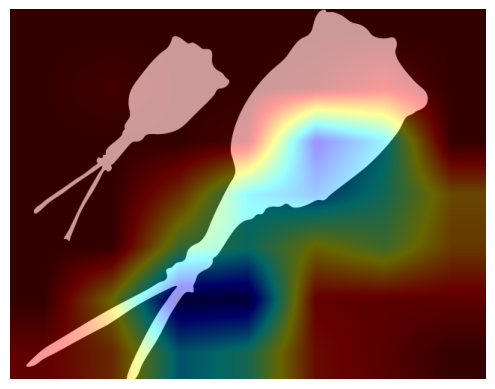

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Rotifera/EMDS5-g09-26-GTM.png
Predicted Class: Epistylis
Confidence: 0.44


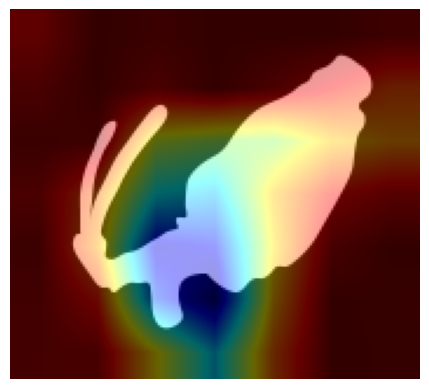

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Rotifera/EMDS5-g09-34-GTM.png
Predicted Class: Rotifera
Confidence: 0.99


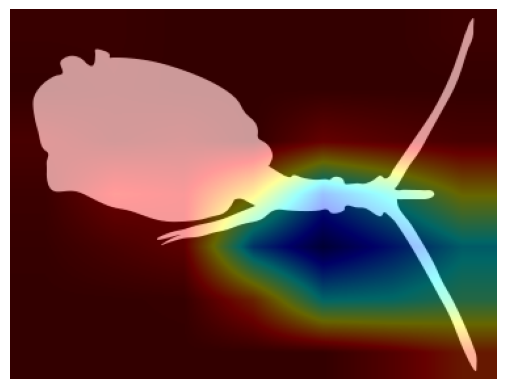

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import tensorflow as tf

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Compute gradients
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature maps
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)  # Normalize heatmap

    return heatmap

# Function to overlay Grad-CAM heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Function to test multiple images
def test_multiple_images(image_folder, model, layer_name, target_size=(224, 224)):
    image_paths = [os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith(('.jpg', '.png', '.jpeg'))]

    for img_path in image_paths:
        # Preprocess image
        img = tf.keras.utils.load_img(img_path, target_size=target_size)
        img_array = tf.keras.utils.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize to [0, 1]

        # Predict class
        predictions = model.predict(img_array)
        predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]
        confidence = np.max(predictions)

        print(f"Image: {img_path}")
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence:.2f}")

        # Generate and overlay Grad-CAM heatmap
        heatmap = generate_gradcam(model, img_array, layer_name)
        overlay_gradcam(img_path, heatmap)

# Path to test images folder
test_image_folder = "/content/drive/MyDrive/RESNETDATASET/Testing/Rotifera"  # Replace with the folder path

# Call the multi-image testing function
test_multiple_images(test_image_folder, model, layer_name="conv5_block3_out")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Siprotomum/EMDS5-g14-01-GTM.png
Predicted Class: Siprostomum
Confidence: 1.00


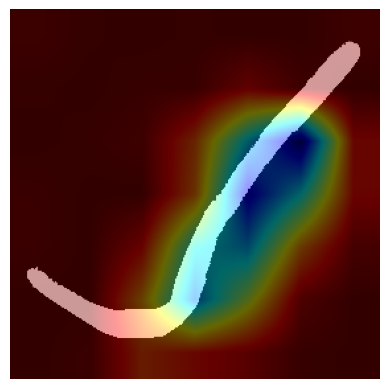

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Siprotomum/EMDS5-g14-05-GTM.png
Predicted Class: Siprostomum
Confidence: 0.92


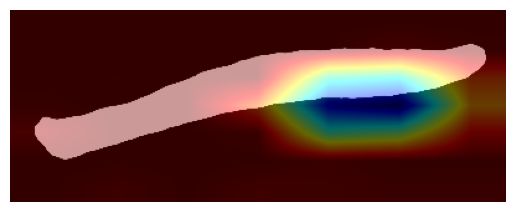

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Siprotomum/EMDS5-g14-11-GTM.png
Predicted Class: Siprostomum
Confidence: 0.98


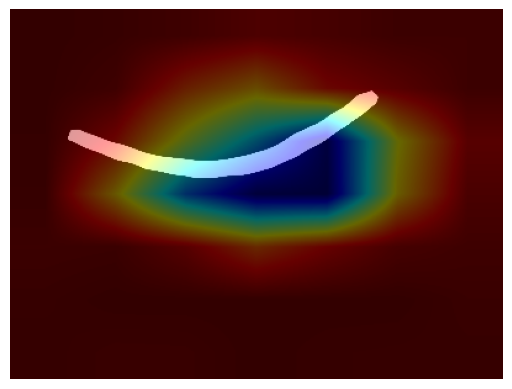

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Siprotomum/EMDS5-g14-15-GTM.png
Predicted Class: Euglena
Confidence: 0.58


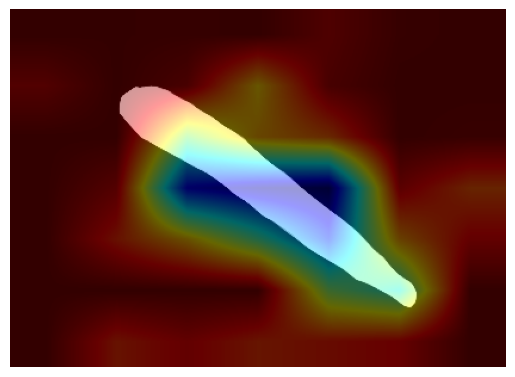

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Siprotomum/EMDS5-g14-21-GTM.png
Predicted Class: Euglena
Confidence: 0.31


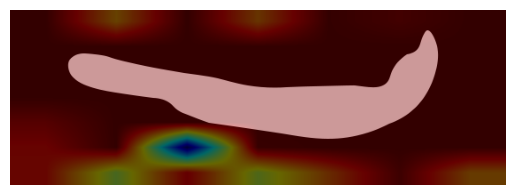

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Siprotomum/EMDS5-g14-28-GTM.png
Predicted Class: Paramecium
Confidence: 0.99


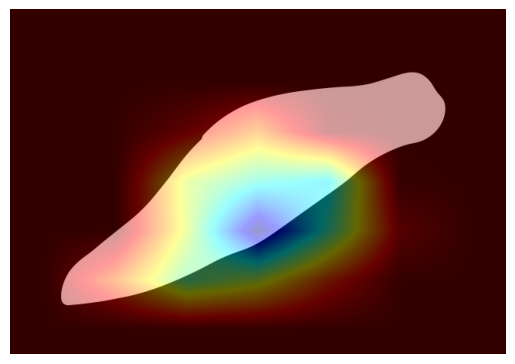

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 664ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Siprotomum/EMDS5-g14-33-GTM.png
Predicted Class: Siprostomum
Confidence: 0.67


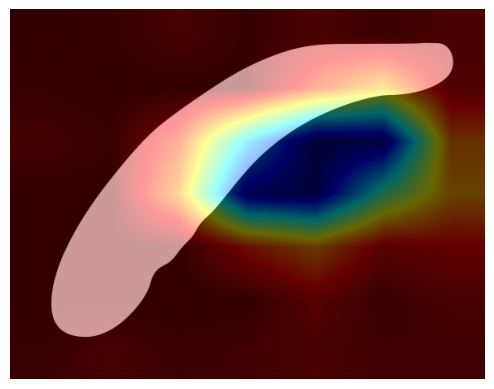

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Siprotomum/EMDS5-g14-39-GTM.png
Predicted Class: Siprostomum
Confidence: 0.83


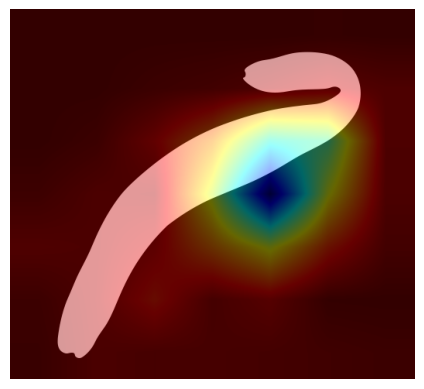

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import tensorflow as tf

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Compute gradients
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature maps
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)  # Normalize heatmap

    return heatmap

# Function to overlay Grad-CAM heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Function to test multiple images
def test_multiple_images(image_folder, model, layer_name, target_size=(224, 224)):
    image_paths = [os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith(('.jpg', '.png', '.jpeg'))]

    for img_path in image_paths:
        # Preprocess image
        img = tf.keras.utils.load_img(img_path, target_size=target_size)
        img_array = tf.keras.utils.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize to [0, 1]

        # Predict class
        predictions = model.predict(img_array)
        predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]
        confidence = np.max(predictions)

        print(f"Image: {img_path}")
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence:.2f}")

        # Generate and overlay Grad-CAM heatmap
        heatmap = generate_gradcam(model, img_array, layer_name)
        overlay_gradcam(img_path, heatmap)

# Path to test images folder
test_image_folder = "/content/drive/MyDrive/RESNETDATASET/Testing/Siprotomum"  # Replace with the folder path

# Call the multi-image testing function
test_multiple_images(test_image_folder, model, layer_name="conv5_block3_out")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Stentor/EMDS5-g13-01-GTM.png
Predicted Class: Stentor
Confidence: 1.00


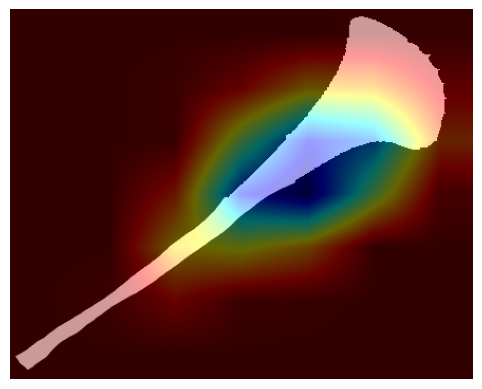

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 660ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Stentor/EMDS5-g13-10-GTM.png
Predicted Class: Stentor
Confidence: 0.42


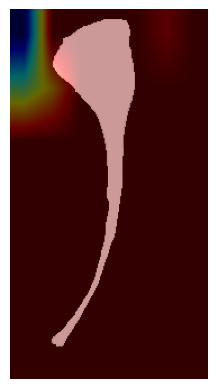

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Stentor/EMDS5-g13-15-GTM.png
Predicted Class: Stentor
Confidence: 1.00


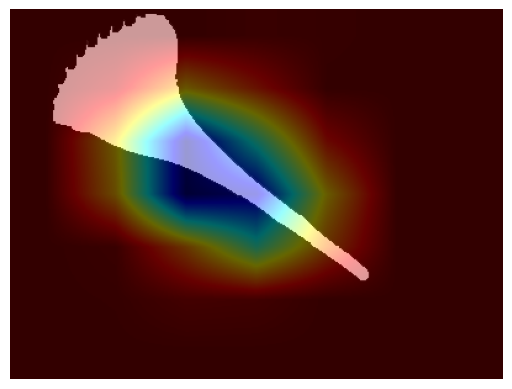

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Stentor/EMDS5-g13-19-GTM.png
Predicted Class: Stentor
Confidence: 0.94


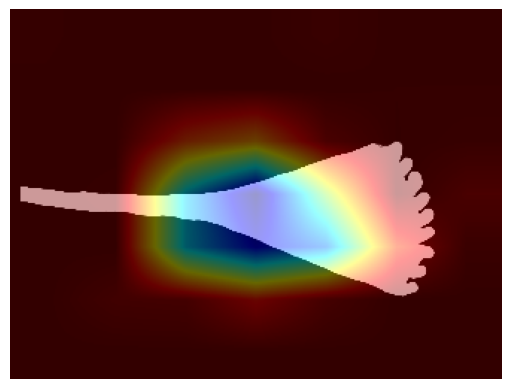

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 687ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Stentor/EMDS5-g13-21-GTM.png
Predicted Class: Stentor
Confidence: 0.98


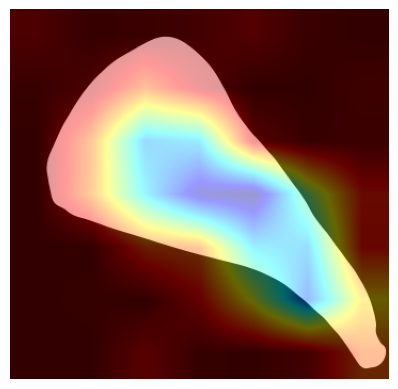

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Stentor/EMDS5-g13-22-GTM.png
Predicted Class: Ceratium
Confidence: 0.49


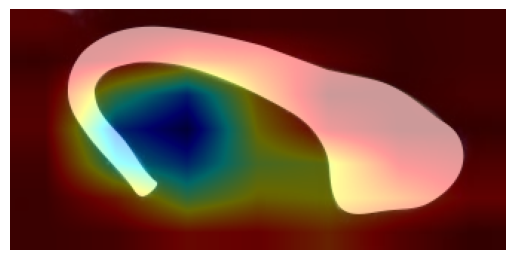

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Stentor/EMDS5-g13-29-GTM.png
Predicted Class: Stentor
Confidence: 0.50


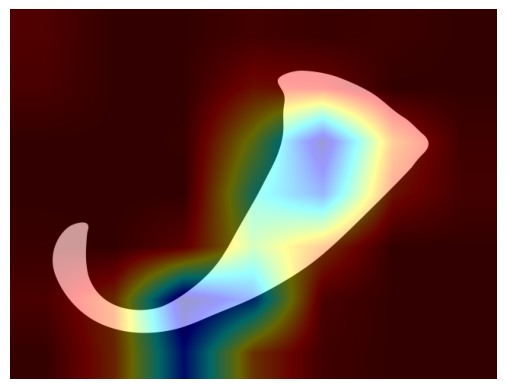

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Stentor/EMDS5-g13-39-GTM.png
Predicted Class: Stentor
Confidence: 0.85


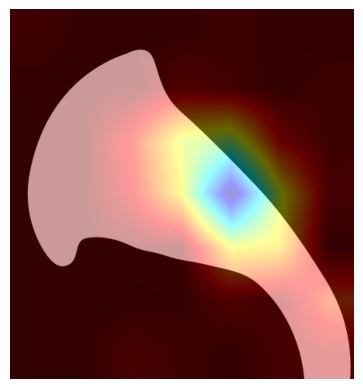

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import tensorflow as tf

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Compute gradients
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature maps
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)  # Normalize heatmap

    return heatmap

# Function to overlay Grad-CAM heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Function to test multiple images
def test_multiple_images(image_folder, model, layer_name, target_size=(224, 224)):
    image_paths = [os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith(('.jpg', '.png', '.jpeg'))]

    for img_path in image_paths:
        # Preprocess image
        img = tf.keras.utils.load_img(img_path, target_size=target_size)
        img_array = tf.keras.utils.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize to [0, 1]

        # Predict class
        predictions = model.predict(img_array)
        predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]
        confidence = np.max(predictions)

        print(f"Image: {img_path}")
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence:.2f}")

        # Generate and overlay Grad-CAM heatmap
        heatmap = generate_gradcam(model, img_array, layer_name)
        overlay_gradcam(img_path, heatmap)

# Path to test images folder
test_image_folder = "/content/drive/MyDrive/RESNETDATASET/Testing/Stentor"  # Replace with the folder path

# Call the multi-image testing function
test_multiple_images(test_image_folder, model, layer_name="conv5_block3_out")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Stylongchia/EMDS5-g20-01-GTM.png
Predicted Class: Euglypha
Confidence: 0.62


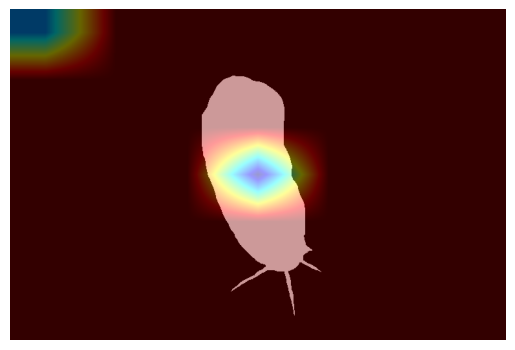

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 655ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Stylongchia/EMDS5-g20-04-GTM.png
Predicted Class: Stylongchia
Confidence: 0.93


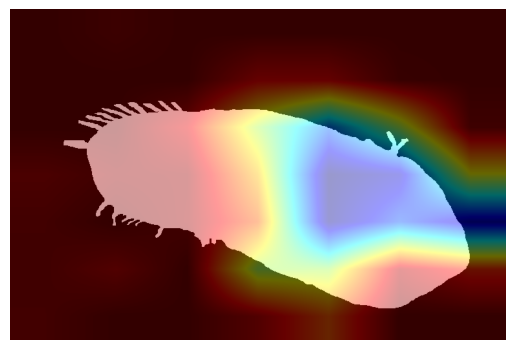

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Stylongchia/EMDS5-g20-11-GTM.png
Predicted Class: Stylongchia
Confidence: 0.97


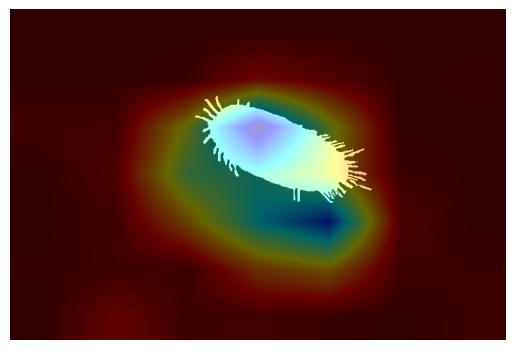

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Stylongchia/EMDS5-g20-29-GTM.png
Predicted Class: Stylongchia
Confidence: 0.97


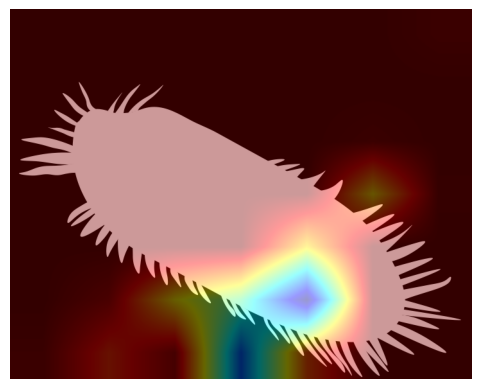

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 644ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Stylongchia/EMDS5-g20-28-GTM.png
Predicted Class: Stylongchia
Confidence: 0.68


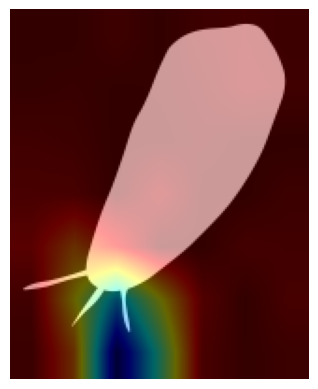

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Stylongchia/EMDS5-g20-35-GTM.png
Predicted Class: Stylongchia
Confidence: 0.97


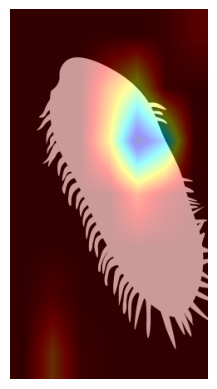

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Stylongchia/EMDS5-g20-36-GTM.png
Predicted Class: Stylongchia
Confidence: 0.77


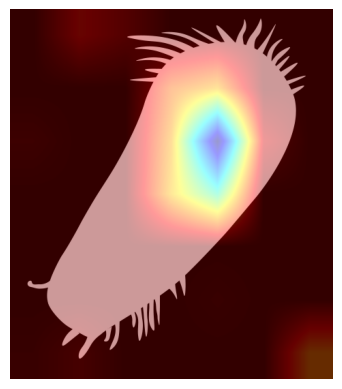

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 661ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Stylongchia/EMDS5-g20-39-GTM.png
Predicted Class: Euglypha
Confidence: 0.21


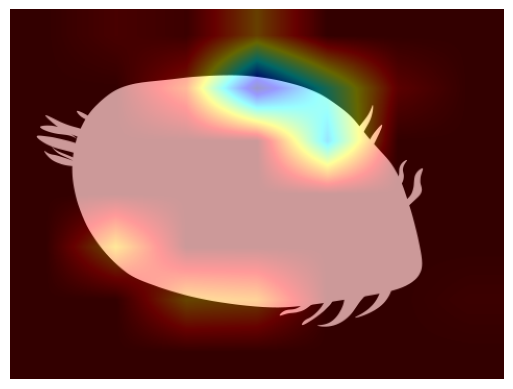

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import tensorflow as tf

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Compute gradients
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature maps
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)  # Normalize heatmap

    return heatmap

# Function to overlay Grad-CAM heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Function to test multiple images
def test_multiple_images(image_folder, model, layer_name, target_size=(224, 224)):
    image_paths = [os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith(('.jpg', '.png', '.jpeg'))]

    for img_path in image_paths:
        # Preprocess image
        img = tf.keras.utils.load_img(img_path, target_size=target_size)
        img_array = tf.keras.utils.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize to [0, 1]

        # Predict class
        predictions = model.predict(img_array)
        predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]
        confidence = np.max(predictions)

        print(f"Image: {img_path}")
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence:.2f}")

        # Generate and overlay Grad-CAM heatmap
        heatmap = generate_gradcam(model, img_array, layer_name)
        overlay_gradcam(img_path, heatmap)

# Path to test images folder
test_image_folder = "/content/drive/MyDrive/RESNETDATASET/Testing/Stylongchia"  # Replace with the folder path

# Call the multi-image testing function
test_multiple_images(test_image_folder, model, layer_name="conv5_block3_out")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Synchaeta/EMDS5-g21-01-GTM.png
Predicted Class: Synchaeta
Confidence: 0.99


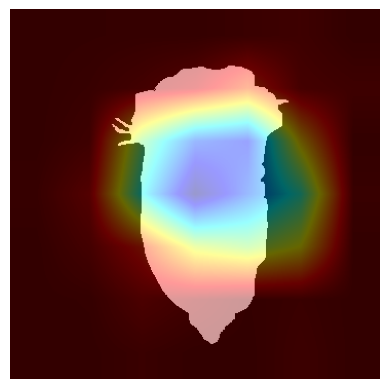

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Synchaeta/EMDS5-g21-10-GTM.png
Predicted Class: Synchaeta
Confidence: 1.00


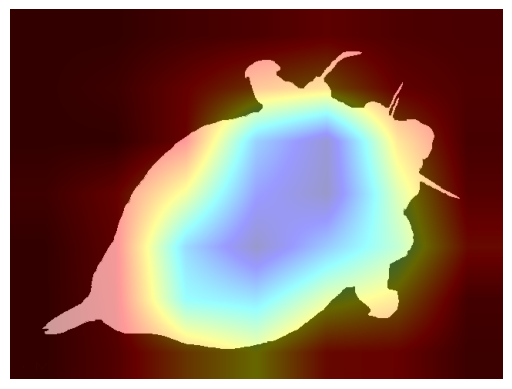

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Synchaeta/EMDS5-g21-19-GTM.png
Predicted Class: Synchaeta
Confidence: 0.41


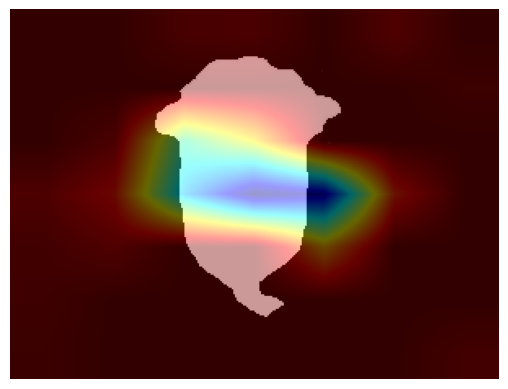

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Synchaeta/EMDS5-g21-20-GTM.png
Predicted Class: Synchaeta
Confidence: 0.78


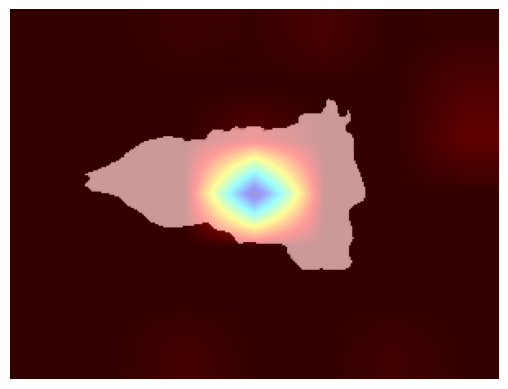

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Synchaeta/EMDS5-g21-16-GTM.png
Predicted Class: Synchaeta
Confidence: 0.88


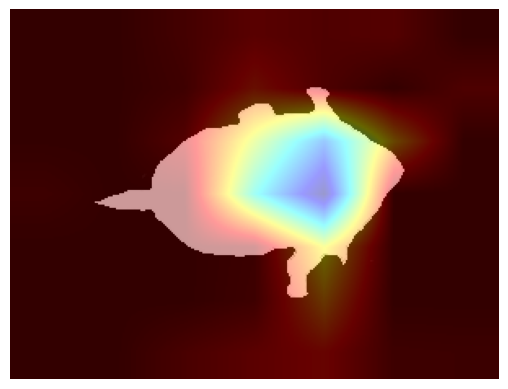

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Synchaeta/EMDS5-g21-29-GTM.png
Predicted Class: Synchaeta
Confidence: 1.00


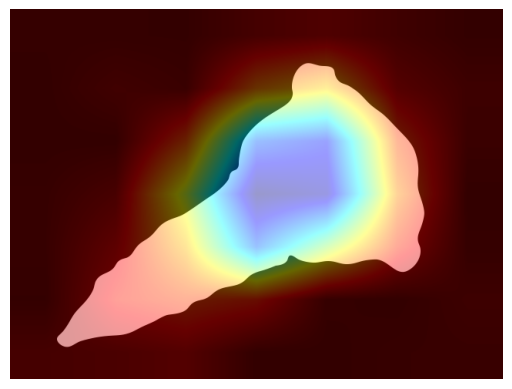

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Synchaeta/EMDS5-g21-31-GTM.png
Predicted Class: Synchaeta
Confidence: 0.98


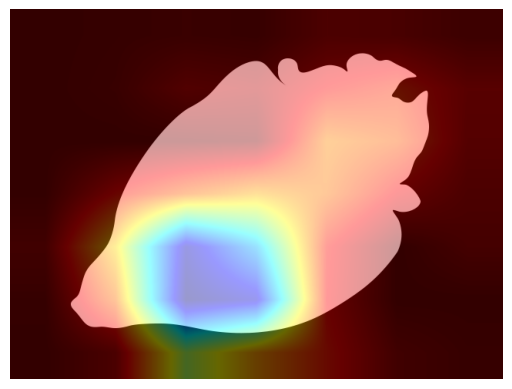

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 634ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Synchaeta/EMDS5-g21-38-GTM.png
Predicted Class: Synchaeta
Confidence: 1.00


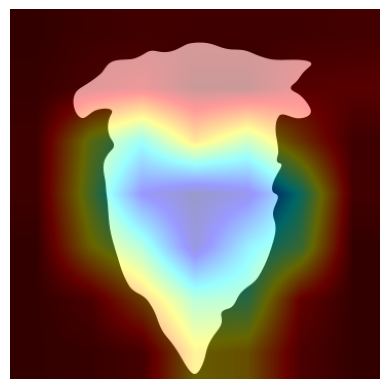

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import tensorflow as tf

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Compute gradients
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature maps
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)  # Normalize heatmap

    return heatmap

# Function to overlay Grad-CAM heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Function to test multiple images
def test_multiple_images(image_folder, model, layer_name, target_size=(224, 224)):
    image_paths = [os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith(('.jpg', '.png', '.jpeg'))]

    for img_path in image_paths:
        # Preprocess image
        img = tf.keras.utils.load_img(img_path, target_size=target_size)
        img_array = tf.keras.utils.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize to [0, 1]

        # Predict class
        predictions = model.predict(img_array)
        predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]
        confidence = np.max(predictions)

        print(f"Image: {img_path}")
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence:.2f}")

        # Generate and overlay Grad-CAM heatmap
        heatmap = generate_gradcam(model, img_array, layer_name)
        overlay_gradcam(img_path, heatmap)

# Path to test images folder
test_image_folder = "/content/drive/MyDrive/RESNETDATASET/Testing/Synchaeta"  # Replace with the folder path

# Call the multi-image testing function
test_multiple_images(test_image_folder, model, layer_name="conv5_block3_out")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Vorticella/EMDS5-g10-06-GTM.png
Predicted Class: Phacus
Confidence: 0.59


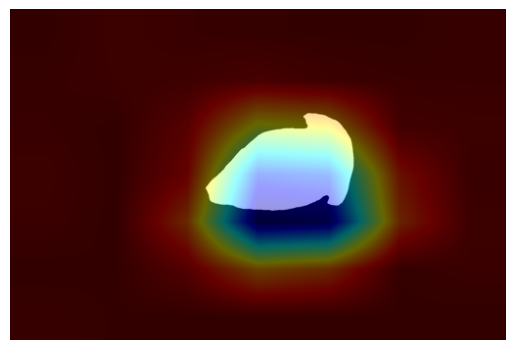

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Vorticella/EMDS5-g10-04-GTM.png
Predicted Class: Vorticella
Confidence: 1.00


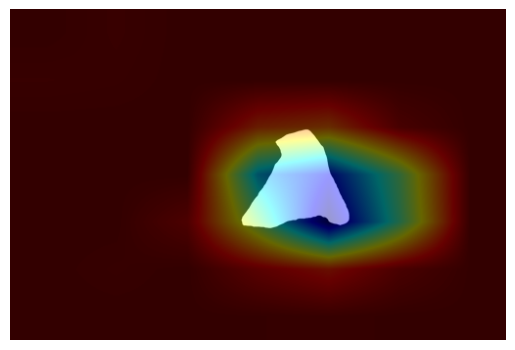

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 674ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Vorticella/EMDS5-g10-02-GTM.png
Predicted Class: Phacus
Confidence: 0.70


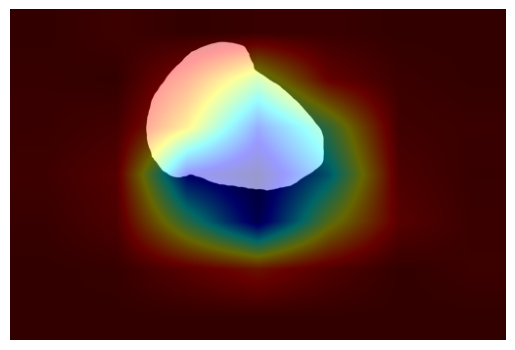

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Vorticella/EMDS5-g10-16-GTM.png
Predicted Class: Phacus
Confidence: 0.90


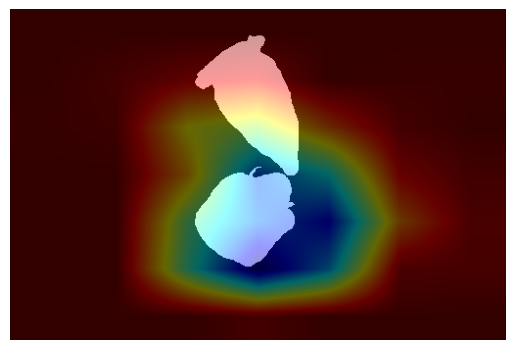

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Vorticella/EMDS5-g10-25-GTM.png
Predicted Class: Vorticella
Confidence: 0.88


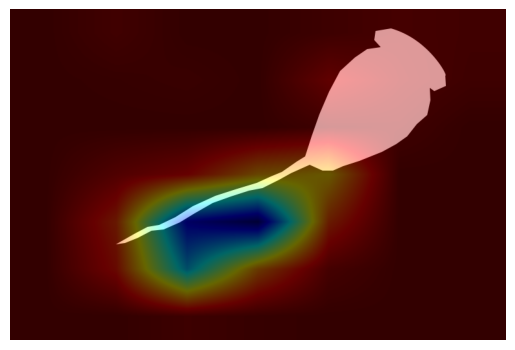

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Vorticella/EMDS5-g10-22-GTM.png
Predicted Class: Vorticella
Confidence: 0.63


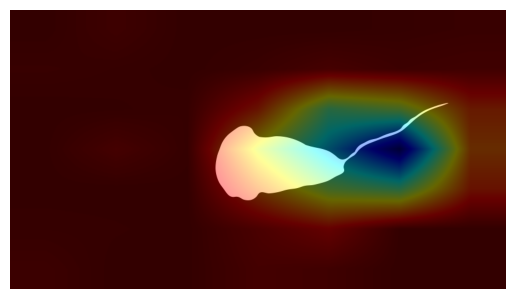

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Vorticella/EMDS5-g10-34-GTM.png
Predicted Class: Epistylis
Confidence: 0.92


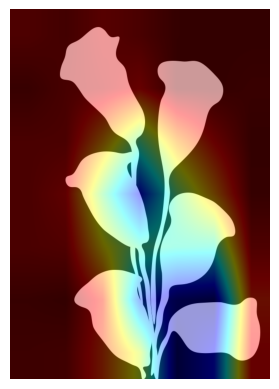

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step
Image: /content/drive/MyDrive/RESNETDATASET/Testing/Vorticella/EMDS5-g10-32-GTM.png
Predicted Class: Vorticella
Confidence: 0.77


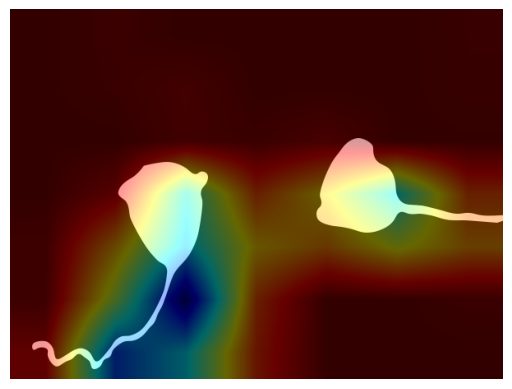

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import tensorflow as tf

# Function to generate Grad-CAM heatmap
def generate_gradcam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]

    # Compute gradients
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weighted feature maps
    conv_outputs = conv_outputs[0]
    heatmap = np.zeros(conv_outputs.shape[:-1])

    for i in range(conv_outputs.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)  # Normalize heatmap

    return heatmap

# Function to overlay Grad-CAM heatmap on the original image
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(heatmap_color, alpha, img, 1 - alpha, 0)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

# Function to test multiple images
def test_multiple_images(image_folder, model, layer_name, target_size=(224, 224)):
    image_paths = [os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith(('.jpg', '.png', '.jpeg'))]

    for img_path in image_paths:
        # Preprocess image
        img = tf.keras.utils.load_img(img_path, target_size=target_size)
        img_array = tf.keras.utils.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize to [0, 1]

        # Predict class
        predictions = model.predict(img_array)
        predicted_class = list(train_generator.class_indices.keys())[np.argmax(predictions)]
        confidence = np.max(predictions)

        print(f"Image: {img_path}")
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence:.2f}")

        # Generate and overlay Grad-CAM heatmap
        heatmap = generate_gradcam(model, img_array, layer_name)
        overlay_gradcam(img_path, heatmap)

# Path to test images folder
test_image_folder = "/content/drive/MyDrive/RESNETDATASET/Testing/Vorticella"  # Replace with the folder path

# Call the multi-image testing function
test_multiple_images(test_image_folder, model, layer_name="conv5_block3_out")


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Generate predictions for test data
y_true = []  # Ground truth labels
y_pred = []  # Predicted labels
class_labels = test_generator.class_indices.keys()  # Class names

# Iterate through test dataset
for images, labels in test_generator:
    predictions = model.predict(images)
    y_true.extend(np.argmax(labels, axis=1))
    y_pred.extend(np.argmax(predictions, axis=1))
    if len(y_true) >= test_generator.samples:
        break

# Generate classification report
report = classification_report(y_true, y_pred, target_names=class_labels)
print("Classification Report:\n", report)


In [ ]:
# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(12, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap="YlGnBu", xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
# Display test images with predictions and ground truth
def plot_predictions(model, test_generator, class_labels, num_images=5):
    plt.figure(figsize=(15, 10))
    test_iter = iter(test_generator)  # Convert the generator to an iterator

    for i in range(num_images):
        # Fetch a batch of images and labels
        img_batch, label_batch = next(test_iter)
        img, label = img_batch[0], label_batch[0]  # Take the first image and label from the batch

        # Predict on the image
        prediction = model.predict(np.expand_dims(img, axis=0))  # Expand dimension for single input
        true_label = class_labels[np.argmax(label)]  # Get true label
        predicted_label = class_labels[np.argmax(prediction)]  # Get predicted label

        # Plot the image
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img)
        plt.title(f"True: {true_label}\nPred: {predicted_label}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Call the function
plot_predictions(model, test_generator, list(class_labels), num_images=5)


In [ ]:
# Plot Training and Validation Accuracy
plt.figure(figsize=(10, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()
